# FINM 33150 Homework 5 FX Carry Trade Strategy 
### Huayu Zhu (huayuz) - UCID: 12413518
### Date: Feb 12 2024

## 1.Introduction 

### 1.1 Motivation 

In this notebook, I will implement a FX trading strategy in the market Egyptian Pound, Hungarian Forint, Costa Rican Colon, and Romanian Leu. Those are the lending currency, and use GBP as the borrowing currency. I will further study the performance of the strategy and the risk factors. 

### 1.2 Packages & Key Constants 

#### Packages 

In [278]:
%matplotlib inline
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy.stats import norm
import plotly.express as px
import pandas as pd
import numpy as np
import scipy as sp
import quandl
import seaborn as sns
import statsmodels.api as sm
import statsmodels.tsa.stattools as ts
from scipy import stats
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import coint
from dataclasses import dataclass
from enum import Enum
from statsmodels.regression.rolling import RollingOLS
import warnings
warnings.filterwarnings('ignore')
from IPython.display import Image
from plotly.offline import iplot, init_notebook_mode
from sklearn.preprocessing import StandardScaler
import functools

In [279]:
init_notebook_mode(connected=True)

#### Key Constants 

In [280]:
myAPIkey = 'yourAPI'
quandl.ApiConfig.api_key = myAPIkey

### 1.3 Helper Functions 

#### Data Fetching(FX)

In [281]:
def get_FX_rates(nameList,start_date,end_date):
    rate_list = []
    for name in nameList: 
        df = quandl.get('CUR/'+name, start_date = start_date, end_date = end_date)
        df.rename(columns={'RATE': name+'_Rate'}, inplace = True)
        rate_list.append(df)
    df = pd.concat(rate_list, axis = 1)
    return df 

#### ZCB Curve Calculation 

In [282]:
def compute_zcb_c(df):
    df_temp = df.copy() 
    for i in range(len(df_temp)): 
        spot = df_temp.iloc[i] 
        for tenor, spot_rate in spot.items(): 
            tenor = float(tenor)
            if tenor > 0.001: 
                times = np.arange(tenor-0.5, 0, step=-0.5)[::-1]
                coupon_half_yr = 0.5*spot_rate
                spot_index_values = spot.index.values.astype(float)
                spot_values = spot.values.astype(float)
                z = np.interp(times, spot_index_values, spot_values)
                preceding_coupons_val = (coupon_half_yr*np.exp(-z*times)).sum()
                df_temp.iloc[i][str(tenor)] = -np.log((1-preceding_coupons_val)/(1+coupon_half_yr))/tenor
    return df_temp 

#### Bond Price Calculation 

In [283]:
def bond_price(zcb, coupon_rate, tenor):
    times = np.arange(tenor, 0, step=-0.5)[::-1]
    if times.shape[0]==0:
        p = 1.0
    else:
        zcb_index_values = zcb.index.values.astype(float)
        zcb_values = zcb.values.astype(float)
        r = np.interp(times, zcb_index_values, zcb_values) # Linear interpolation
        p = np.exp(-tenor*r[-1]) + 0.5 * coupon_rate * np.exp(-r*times).sum()
    return p

In [284]:
def compute_bond_price_df(df_yc, df_zc):
    df_temp = pd.DataFrame(index=df_zc.index, columns=['price_now','price_1wk'])
    for i, date in enumerate(df_zc.index):
        coupon_rate = df_yc.at[date, '5.0']
        zcb = df_zc.loc[date]
        df_temp.at[date, 'price_now'] = bond_price(zcb, coupon_rate, 5)
        
        # Check if there's a next date available
        if i + 1 < len(df_zc.index):
            next_date = df_zc.index[i + 1]
            zcb_1 = df_zc.loc[next_date]
            df_temp.at[date, 'price_1wk'] = bond_price(zcb_1, coupon_rate, 5 - 1/52)
        
    df_temp['5Y_spot_rate'] = df_yc['5.0']
    df_temp['5Y_zc'] = df_zc['5.0']
    return df_temp

#### Check data (filter Wednesday and fill missing value)

In [285]:
def check_data(df):
    df = df[df.index.weekday == 2]

    start_date = df.index.min()
    end_date = df.index.max()
    all_wednesdays = pd.date_range(start=start_date, end=end_date, freq='W-WED')

    df = df.reindex(all_wednesdays).fillna(method='ffill')
   

    print('The start date is', df.index.min())
    print('The end date is', df.index.max())
    print('The shape of the df is', df.shape)

    for c in df.columns: 
        m = df[c].isnull().sum()
        if m != 0: 
            print(f'There are {m} missing values in column {c}')

    d = df.index.duplicated().sum()
    if d != 0: 
        print(f'There are {d} duplicated indices in the dataframe.')

    return df

#### Get FF 

In [286]:
def get_Factors_data_emerge(start_date,end_date): 
    df = pd.read_csv('Emerging_5_Factors.csv', skiprows=6)

    # set the time as index 
    df.rename(columns = {'Unnamed: 0': 'date'}, inplace = True)
    df = df[240:414]

    #df = df.set_index('date')
    return df 
    # set the string time as datetime 
    df.index = pd.to_datetime(df.index)

    # slice the time interval 
    #df = df.loc[start_date:end_date, :]

    return df 

In [287]:
def get_Factors_data_dev(start_date,end_date): 
    df = pd.read_csv('Developed_3_Factors_Daily.csv', skiprows=6)

    # set the time as index 
    df.rename(columns = {'Unnamed: 0': 'date'}, inplace = True)
    df = df.set_index('date')

    # set the string time as datetime 
    df.index = pd.to_datetime(df.index, format='%Y%m%d')

    # slice the time interval 
    df = df.loc[start_date:end_date, :]
    df = df/252

    return df 

#### Trading Performance 

In [288]:
def trade_per(df_1):
    ret = df_1.copy() 

    return_rate = df_1['return'].to_frame()
    end_index = df_1.index.max()
    df = pd.DataFrame()
    df['mean'] = round(return_rate.mean(),6)
    df['volatility'] = round(return_rate.std(),6)
    df['sharpe ratio (benchmark = 0)'] = return_rate.mean()/return_rate.std()
    df['min'] = return_rate.min() 
    df['max'] = return_rate.max()
    wealth_index =  (1+return_rate).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdowns = (wealth_index - previous_peaks)/previous_peaks
    df['max drawdown'] = drawdowns.min()
    df['VaR'] = return_rate.quantile(0.05)
    df['CVaR (0.05)'] = return_rate[return_rate <= return_rate.quantile(.05, axis = 0)].mean()
    df['Skew'] = return_rate.skew()
    df['Kurtosis'] = return_rate.kurtosis()
    df['final return'] = ret.at[end_index,'cumulative_return']
    df['final pnl'] = ret.at[end_index,'cumulative_pnl']
    df['trade length(wk)'] =len(ret)
    df['trade weeks'] = len(ret[ret['enter_market']!= 0])
    df['profit from borrow(rate)'] = len(ret[ret['pnl_borrow'] > 0])/len(ret[ret['enter_market']!= 0])
    df['profit from lend(rate)'] = len(ret[ret['pnl_lend'] > 0])/len(ret[ret['enter_market']!= 0]) 
    df.index = ['performance summary']
    return df

#### Trading Plots 

In [289]:
def draw_plot(df):

    fig = make_subplots(
        rows=2,
        cols=2,
        subplot_titles=[
            f"Cumulative Returns",
            f"Cumulative PNL",
            f"Weekly Returns",
            f"Weekly PNL",
        ],
    )

    fig.add_trace(
        go.Scatter(
        x=df.index,
        y=df['cumulative_return'],
        line=dict(width=1),
        name="cumualtive return",
        ),
        row=1,
        col=1,
    )

    fig.add_trace(
        go.Scatter(
        x=df.index,
        y=df['return'],
        name='weekly return',
        line=dict(width=1),
        ),
        row=2,
        col=1,
    )

    fig.add_trace(
        go.Scatter(
        x=df.index,
        y=df['cumulative_pnl'],
        line=dict(width=1),  
        name='cumulative pnl',
        ),
        row=1,
        col=2,
    )


    fig.add_trace(
        go.Scatter(
        x=df.index,
        y=df['pnl'],
        line=dict(width=1),  
        name='weekly pnl',
        ),
        row=2,
        col=2,
    )
    fig.add_trace(
        go.Scatter(
        x=df.index,
        y=df['pnl_borrow'],
        line=dict(width=1),  
        name='pnl_borrow(unit:USD)',
        ),
        row=2,
        col=2,
    )

    fig.add_trace(go.Scatter(
        x=df.index,
        y=df['pnl_lend'],
        line=dict(width=1),  
        name='pnl_lend(unit:USD)'
        ),
        row=2,
        col=2,
    )


    fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True,
        legend=dict(
        font=dict(
            size=10  # Set the font size here
        )
    )
    )

    iplot(fig)





In [290]:
def plot(df):

    plt.figure(figsize=(10, 6))
    plt.plot(df.index, df['cumulative_return'], label='Cumulative Return', linewidth=2)
    plt.title('Cumulative Return Line Plot')
    plt.xlabel('Time')
    plt.ylabel('Cumulative Return')
    plt.grid(color='lightgrey', linestyle='-', linewidth=0.5)
    plt.legend()
    plt.show()
    plt.clf() 
    
    # Weekly Return line plot
    plt.figure(figsize=(10, 6))
    plt.plot(df.index, df['return'], label='Weekly Return', linewidth=2, color='orange')
    plt.title('Weekly Return Line Plot')
    plt.xlabel('Time')
    plt.ylabel('Weekly Return')
    plt.grid(color='lightgrey', linestyle='-', linewidth=0.5)
    plt.legend()
    plt.show()
    plt.clf() 

    # Cumulative PNL plot
    plt.figure(figsize=(10, 6))
    plt.plot(df.index, df['cumulative_pnl'], label='Cumulative PNL', linewidth=2, color='green')
    plt.title('Cumulative PNL Plot')
    plt.xlabel('Time')
    plt.ylabel('PNL (Unit: USD)')
    plt.grid(color='lightgrey', linestyle='-', linewidth=0.5)
    plt.legend()
    plt.show()
    plt.clf() 
    # PNL plot with breakdown
    plt.figure(figsize=(10, 6))
    plt.plot(df.index, df['pnl'], label='PNL (Unit: USD)', linewidth=2)
    plt.plot(df.index, df['pnl_borrow'], label='PNL Borrow (Unit: USD)', linewidth=2, linestyle='--')
    plt.plot(df.index, df['pnl_lend'], label='PNL Lend (Unit: USD)', linewidth=2, linestyle=':')
    plt.title('PNL Plot')
    plt.xlabel('Time')
    plt.ylabel('PNL (Unit: USD)')
    plt.grid(color='lightgrey', linestyle='-', linewidth=0.5)
    plt.legend()
    plt.show()



#### Trading Strategy 

In [291]:
def run_trade(df, trade_process = True, trade_performance = False, trade_plot = False):
    trade = df.copy() 
    # set up some columns to track the trade 
    trade['enter_market'] = 0 
    trade['exit_market'] = 0 
    trade['q_borrow'] = 0 
    trade['q_lend'] = 0 
    trade['pnl'] = 0 
    trade['return'] = 0 
    trade['notional'] = 0 
    trade['cumulative_pnl'] = 0 
    trade['cumulative_return'] = 0 
    trade['pnl_borrow'] = 0 
    trade['pnl_lend'] = 0 


    for i,date in enumerate(trade.index):
        # check whether need to enter 
        if i < len(trade)-1:
            if trade.at[date,'5Y_spot_rate'] - 0.01 > trade.at[date,'OIS']:
                trade.at[date,'enter_market'] = 1 
                trade.at[date,'q_borrow'] = -10000000 * 0.8 * trade.at[date,'GBP'] # money borrowed as GBP 
                trade.at[date,'q_lend'] = 10000000 * trade.at[date,'rate_lending']/trade.at[date,'price_now']

                next_wk = trade.index[i + 1]
                trade.at[next_wk,'exit_market'] = 1 
        # check whether need to exist, if exist, calculate the pnl and return 
        if trade.at[date,'exit_market'] == 1: 
            pre_wk = trade.index[i-1]
            trade.at[date,'notional'] = 10000000
            # i.r = ois + 0.005, but it is annualized, get the weekly i.r 
            borrow_money = trade.at[pre_wk,'q_borrow'] * (((trade.at[pre_wk,'OIS']+0.005)/52) + 1)/trade.at[date,'GBP'] # convert to USD 
            lending_money = trade.at[pre_wk,'q_lend'] * trade.at[pre_wk,'price_1wk']/trade.at[date,'rate_lending'] # convert to USD 
            trade.at[date,'pnl_borrow'] = 10000000 * 0.8 + borrow_money 
            trade.at[date,'pnl_lend'] = lending_money - 10000000
            trade.at[date,'pnl'] = borrow_money + lending_money - (10000000 * 0.2)
            trade.at[date,'return'] = trade.at[date,'pnl']/10000000
        
    trade['cumulative_pnl'] = trade['pnl'].cumsum() 
    trade['cumulative_return'] = trade['pnl'].cumsum()/ trade['notional'].cumsum()

    start_index = trade.index.min() 
    trade.at[start_index,'cumulative_return'] = 0 

    if trade_plot == True: 
        draw_plot(trade)
    if trade_process == True: 
        return trade
    elif trade_performance == True: 
        return trade_per(trade)
    


#### Trading Strategy Equal Weighted 

In [292]:
def run_trade_ew(df1,df2,df3,df4, trade_process = True, trade_performance = False, trade_plot = False):
    trade = df1.copy()
    # set up some columns to track the trade 
    trade['enter_market'] = 0 
    trade['exit_market'] = 0 
    trade['q_borrow'] = 0 
    trade['q_lend_EGP'] = 0 
    trade['q_lend_HUF'] = 0 
    trade['q_lend_CRC'] = 0 
    trade['q_lend_RON'] = 0 
    trade['pnl'] = 0 
    trade['return'] = 0 
    trade['notional'] = 0 
    trade['cumulative_pnl'] = 0 
    trade['cumulative_return'] = 0 
    trade['pnl_borrow'] = 0 
    trade['pnl_lend'] = 0 


    for i,date in enumerate(trade.index):
        # check whether need to enter 
        if i < len(trade)-1:
            if (df1.at[date,'5Y_spot_rate'] + df2.at[date,'5Y_spot_rate'] + df3.at[date,'5Y_spot_rate'] + df4.at[date,'5Y_spot_rate'])/4  - 0.01 > trade.at[date,'OIS']:
                trade.at[date,'enter_market'] = 1 
                trade.at[date,'q_borrow'] = -10000000 * 0.8 * trade.at[date,'GBP'] # money borrowed as GBP 
                trade.at[date,'q_lend_EGP'] = 10000000/4 * df1.at[date,'rate_lending']/df1.at[date,'price_now']
                trade.at[date,'q_lend_HUF'] = 10000000/4 * df2.at[date,'rate_lending']/df2.at[date,'price_now']
                trade.at[date,'q_lend_CRC'] = 10000000/4 * df3.at[date,'rate_lending']/df3.at[date,'price_now']
                trade.at[date,'q_lend_RON'] = 10000000/4 * df4.at[date,'rate_lending']/df4.at[date,'price_now']

                next_wk = trade.index[i + 1]
                trade.at[next_wk,'exit_market'] = 1 
        # check whether need to exist, if exist, calculate the pnl and return 
        if trade.at[date,'exit_market'] == 1: 
            pre_wk = trade.index[i-1]
            trade.at[date,'notional'] = 10000000
            # i.r = ois + 0.005, but it is annualized, get the weekly i.r 
            borrow_money = trade.at[pre_wk,'q_borrow'] * (((trade.at[pre_wk,'OIS']+0.005)/52) + 1)/trade.at[date,'GBP'] # convert to USD 
            a = trade.at[pre_wk,'q_lend_EGP'] * df1.at[pre_wk,'price_1wk']/df1.at[date,'rate_lending'] 
            b = trade.at[pre_wk,'q_lend_HUF'] * df2.at[pre_wk,'price_1wk']/df2.at[date,'rate_lending']
            c = trade.at[pre_wk,'q_lend_CRC'] * df3.at[pre_wk,'price_1wk']/df3.at[date,'rate_lending']
            d = trade.at[pre_wk,'q_lend_RON'] * df4.at[pre_wk,'price_1wk']/df4.at[date,'rate_lending']
            lending_money = a+b+c+d

            trade.at[date,'pnl_borrow'] = 10000000 * 0.8 + borrow_money 
            trade.at[date,'pnl_lend'] = lending_money - 10000000
            trade.at[date,'pnl'] = borrow_money + lending_money - (10000000 * 0.2)
            trade.at[date,'return'] = trade.at[date,'pnl']/10000000
        
    trade['cumulative_pnl'] = trade['pnl'].cumsum() 
    trade['cumulative_return'] = trade['pnl'].cumsum()/ trade['notional'].cumsum()

    start_index = trade.index.min() 
    trade.at[start_index,'cumulative_return'] = 0 

    if trade_plot == True: 
        draw_plot(trade)
    if trade_process == True: 
        return trade
    elif trade_performance == True: 
        return trade_per(trade)
    

#### Plot Bond Price 

In [293]:
def plot_bond_price(df):
    fig = go.Figure() 
    fig.add_trace(go.Scatter(
            x=df.index,
            y=df['price_now'],
            mode='lines',  
            name='bond price'
    ))

    fig.add_trace(go.Scatter(
            x=df.index,
            y=df['price_1wk'],
            mode='lines',  
            name='next week bond price'
    ))

    fig.update_layout(
        template="none",
        autosize = True,
        title_text='Bond Price Plot',
        showlegend=True 
    )
    iplot(fig)

#### plot ir 

In [294]:
def plot_ir_price(df):
    fig = go.Figure() 
    fig.add_trace(go.Scatter(
            x=df.index,
            y=df['5Y_spot_rate'],
            mode='lines',  
            name='spot_rate'
    ))

    fig.add_trace(go.Scatter(
            x=df.index,
            y=df['OIS'] + 0.01,
            mode='lines',  
            name='OIS + 0.01'
    ))

    fig.update_layout(
        template="none",
        autosize = True,
        title_text='Rate Plot',
        showlegend=True 
    )
    iplot(fig)

#### plot rate 

In [295]:
def plot_rate(df,cur): 
    fig = go.Figure() 
    fig.add_trace(go.Scatter(
            x=df.index,
            y=df[cur],
            mode='lines',  
            name=cur
    ))

    fig.add_trace(go.Scatter(
            x=df.index,
            y=df['GBP_Rate']*10,
            mode='lines',  
            name='GBP_Rate * 10'
    ))

    fig.update_layout(
        template="none",
        autosize = True,
        title_text='FX Rate plot',
        showlegend=True 
    )
    iplot(fig)

## 2.Data 

In this section, I will mainly focus on the data preparation. In this notebook, we will fetch serveral data: 
1. shortest availavle rates for UK overnight index swaps (OIS) [Data source: IUDSOIA](https://www.bankofengland.co.uk/boeapps/database/fromshowcolumns.asp?Travel=NIxAZxSUx&FromSeries=1&ToSeries=50&DAT=RNG&FD=1&FM=Jan&FY=2010&TD=11&TM=May&TY=2025&FNY=Y&CSVF=TT&html.x=66&html.y=26&SeriesCodes=IUDSOIA&UsingCodes=Y&Filter=N&title=IUDSOIA&VPD=Y)
2. spot FX rates for the dollar versus pounds [Data Source: Quandl CUR database](https://data.nasdaq.com/databases/CUR)
3. Swap yield curves and FX Rates for Egyptian Pound, Hungarian Forint, Costa Rican Colon and Romanian Leu [InferredYieldCurves file and the Jupyter notebook Zero And Spot Curve]


Currency Codes we get from wiki: 
* US Dollar: USD 
* UK Pound: GBP
* Egyptian Pound: EGP 
* Hungarian Forint: HUF
* Costa Rican Colon: CRC
* Romanian Leu: RON 

### 2.1 OIS Data Fetching 

In this part, I fetch the OIS data using method 1 in the footnote. I also set the start data and end date as the minimum and maximum index of the dataframe in order for future use. Here the OIS is annualized result. 

In [296]:
OIS = pd.read_csv('IUDSOIA  Bank of England  Database.csv')
OIS['Date'] = pd.to_datetime(OIS['Date'])
OIS = OIS.sort_values(by ='Date')
OIS.set_index('Date',inplace = True) 
OIS = OIS.rename(columns={'Daily Sterling overnight index average (SONIA) rate              [a] [b]             IUDSOIA':'OIS'})
OIS['OIS'] = OIS['OIS']/100
OIS.head(3)

,OIS
Date,
2010-01-04,0.004487
2010-01-05,0.004514
2010-01-06,0.004534


In [297]:
start_date = OIS.index.min()
end_date = OIS.index.max() 

### 2.2 FX Rate Fetching 

Based on the start date and the end date we got from previous dataset, we extract the according FX Rate at that period from Quandl, CUR database. All  the FX Rate we get are USD/Other_Currency. This will be usedful for us to do the later trading strategy and help us to convert the profit back to USD from different markets. 

In [298]:
nameList = ['GBP','EGP','HUF','CRC','RON']

Code presentation for the FX Rate: 

In [299]:
df_rate = get_FX_rates(nameList,start_date,end_date)
df_rate.head(3)

,GBP_Rate,EGP_Rate,HUF_Rate,CRC_Rate,RON_Rate
DATE,,,,,
2010-01-04,0.620480,5.486981,187.200587,559.290882,2.933135
2010-01-05,0.624472,5.465845,186.364631,559.418301,2.903328
2010-01-06,0.625042,5.454573,187.136627,560.918803,2.895457


### 2.3 Yield Curve, ZCB, and bond price calculation 

In this section, we get the spot rate curve data from the inferred_yield_curve table. However, all the data are in the same dataframe, and need to be recalculated in order to do quantitative trading in the latter part. There are some key steps that I have go trough: 

1. Get all the spot rate data for the 4 countries' bonds 
2. re-arrange the dataframe to split the bonds that in one date but have different time to maturities 
3. re-write the zero-curve fuction in zero_and_spot_curves in the notebook to calcualte the zero curve rate for all the data points 
4. based on the zc rate we get, re-write the bond pricing function in the same notebook and calculate the price for the bond now and price for the bond one week from now 
5. put all the data in one table for the latter usage

Some remark about the data we get: 1. it is annualized, 2. all the price are calculated based on the TTM == 5 yr. 3. all the price all in the unit of its original currency. 

In [300]:
df_yield_curves = pd.read_table('InferredYieldCurves_2024.tab')
df_yield_curves.shortname.unique()

array(['Arab Rep Egypt', 'Federative Rep Brazil', 'Hungary',
       'Islamic Rep Pakistan', 'Kdom Thailand', 'Rep Colombia',
       'Rep Costa Rica', 'Rep El Salvador', 'Rep Guatemala',
       'Rep Kazakhstan', 'Rep Panama', 'Rep Peru', 'Rep Poland',
       'Rep South Africa', 'Rep Trinidad & Tobago', 'Rep Turkey',
       'Rep of Angola', 'Rep of Ghana', 'Rep of Iraq', 'Rep of Serbia',
       'Romania', 'Socialist Rep Vietnam', 'Utd Mexican Sts'],
      dtype=object)

In [301]:
def f(x):
    if x == '10Y':
        return 10.0 
    elif x == '5Y':
        return 5.0
    elif x == '1Y':
        return 1.0
    elif x =='6M':
        return 0.5 

In [302]:
yield_c_list_name = ['Arab Rep Egypt','Hungary','Rep Costa Rica','Romania']
df_yield_curves = df_yield_curves[df_yield_curves['shortname'].isin(yield_c_list_name)]
grouped = df_yield_curves.groupby('shortname')
split_dfs = {}
dfs = []
for group_name, group_df in grouped:
    split_dfs[group_name] = group_df
for name in yield_c_list_name: 
    split_dfs[name].drop(columns = ['Unnamed: 0', 'shortname'], inplace = True)
    split_dfs[name]['tenor'] = split_dfs[name]['tenor'].apply(lambda x: f(x))
    split_dfs[name].set_index(['date'], inplace = True) 
    split_dfs[name].rename(columns = {'yield': 'spot_rate'}, inplace = True)
    split_dfs[name].index = pd.to_datetime(split_dfs[name].index)
    df0 = split_dfs[name][split_dfs[name]['tenor'] == 0.5]
    df0.drop(columns = ['tenor'], inplace = True)
    df0.rename(columns = {'spot_rate':'0.5'}, inplace =True)
    df1 = split_dfs[name][split_dfs[name]['tenor'] == 1.0]
    df1.drop(columns = ['tenor'], inplace = True)
    df1.rename(columns = {'spot_rate':'1.0'}, inplace =True)
    df5 = split_dfs[name][split_dfs[name]['tenor'] == 5.0]
    df5.drop(columns = ['tenor'], inplace = True)
    df5.rename(columns = {'spot_rate':'5.0'}, inplace =True)
    df10 = split_dfs[name][split_dfs[name]['tenor'] == 10.0]
    df10.drop(columns = ['tenor'], inplace = True)
    df10.rename(columns = {'spot_rate':'10.0'}, inplace =True)
    df = pd.concat([df0,df1,df5,df10],axis=1)
    df = df.dropna()
    dfs.append(df)

EGP_YC = dfs[0]
HUF_YC = dfs[1]
CRC_YC = dfs[2]
RON_YC = dfs[3]

In [303]:
EGP_ZC = compute_zcb_c(EGP_YC) 
HUF_ZC = compute_zcb_c(HUF_YC) 
CRC_ZC = compute_zcb_c(CRC_YC) 
RON_ZC = compute_zcb_c(RON_YC) 

**change the bond price calculation function asap**

In [304]:
EGP_sp = compute_bond_price_df(EGP_YC,EGP_ZC)
HUF_sp = compute_bond_price_df(HUF_YC,HUF_ZC)
CRC_sp = compute_bond_price_df(CRC_YC,CRC_ZC)
RON_sp = compute_bond_price_df(RON_YC,RON_ZC)


A sample code presentation used for future calculation: 

In [305]:
EGP_sp.head(3)

,price_now,price_1wk,5Y_spot_rate,5Y_zc
date,,,,
2010-01-04,0.999594,1.010247,0.061109,0.062423
2010-01-05,0.999624,1.002216,0.059096,0.060348
2010-01-06,0.999624,1.002216,0.058905,0.060159


### 2.4 Data Cleaning/ Data Range 

In this section, I would check each df to see its size, range, and if there are missing data and dupliated data on Wedensday. It helps me to select a range of time to do the FX trading strategy in section 4.  

After basic checking, there is no missing value or duplicated index in the Wednesday Data that I am planning to use. I need to align the data index for future usage. 

In [306]:
wed_OIS = check_data(OIS)

The start date is 2010-01-06 00:00:00
The end date is 2024-02-07 00:00:00
The shape of the df is (736, 1)


In [307]:
wed_rate = check_data(df_rate)

The start date is 2010-01-06 00:00:00
The end date is 2024-02-07 00:00:00
The shape of the df is (736, 5)


In [308]:
wed_EGP = check_data(EGP_sp)
wed_HUF = check_data(HUF_sp) 
wed_CRC = check_data(CRC_sp)
wed_RON = check_data(RON_sp) 

The start date is 2010-01-06 00:00:00
The end date is 2024-01-31 00:00:00
The shape of the df is (735, 4)
The start date is 2012-01-04 00:00:00
The end date is 2024-01-31 00:00:00
The shape of the df is (631, 4)
The start date is 2010-01-06 00:00:00
The end date is 2024-01-31 00:00:00
The shape of the df is (735, 4)
The start date is 2010-01-06 00:00:00
The end date is 2024-01-31 00:00:00
The shape of the df is (735, 4)


From above, we can tell that different countries' data have different ranges. I will select a trading range from 2013-2024. 

In [309]:
wed_EGP['OIS'] = wed_OIS['OIS'] 
wed_EGP['GBP'] = wed_rate['GBP_Rate']
wed_EGP['rate_lending'] = wed_rate['EGP_Rate']
wed_EGP = wed_EGP.loc['2013-01-01':]
#wed_EGP

In [310]:
wed_HUF['OIS'] = wed_OIS['OIS'] 
wed_HUF['GBP'] = wed_rate['GBP_Rate']
wed_HUF['rate_lending'] = wed_rate['HUF_Rate']
wed_HUF = wed_HUF.loc['2013-01-01':]
#wed_HUF

In [311]:
wed_CRC['OIS'] = wed_OIS['OIS'] 
wed_CRC['GBP'] = wed_rate['GBP_Rate']
wed_CRC['rate_lending'] = wed_rate['CRC_Rate']
wed_CRC = wed_CRC.loc['2013-01-01':]
#wed_CRC

In [312]:
wed_RON['OIS'] = wed_OIS['OIS'] 
wed_RON['GBP'] = wed_rate['GBP_Rate']
wed_RON['rate_lending'] = wed_rate['RON_Rate']
wed_RON = wed_RON.loc['2013-01-01':]
#wed_RON

In [313]:
ff_factors_emerge = get_Factors_data_emerge(start_date,end_date)
try:
    ff_factors_emerge['date'] = pd.to_datetime(ff_factors_emerge['date'], format='%Y%m')
except ValueError as e:
    error_message = str(e)
    print(f"Conversion failed: {error_message}")
ff_factors_emerge['date'] = ff_factors_emerge['date'].str.strip()
ff_factors_emerge = ff_factors_emerge[ff_factors_emerge['date'].str.match(r'^\d{6}$')]
try:
    ff_factors_emerge['date'] = pd.to_datetime(ff_factors_emerge['date'], format='%Y%m')
    print("Conversion successful.")
except ValueError as e:
    error_message = str(e)
    print(f"Conversion failed: {error_message}")
    
ff_factors_emerge.set_index('date', inplace = True)
ff_factors_emerge= ff_factors_emerge.loc['2013-01-01':]
for c in ff_factors_emerge.columns: 
    ff_factors_emerge[c] = ff_factors_emerge[c].astype(float)/252*20
#ff_factors_emerge

Conversion failed: unconverted data remains when parsing with format "%Y%m": "   ", at position 0. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.
Conversion successful.


In [314]:
ff_factors_dev = get_Factors_data_dev('2013-01-01',end_date)
ff_factors_dev = check_data(ff_factors_dev)
ff_factors_dev = ff_factors_dev * 5 

The start date is 2013-01-02 00:00:00
The end date is 2023-11-29 00:00:00
The shape of the df is (570, 4)


## 3.Data Analysis 

I plan to use first few years' data to do the data analysis to see some basic properties of the dataset so that we are this dataset can be used for FX Carry Trade. This part of data will not be used to implement the trading strategy to avoid bais. 

### 3.1 FX Rate 

HUF and CRC very inexpensive comparing to USD. The EGP and RON are closer. The EGP, RON, GBP does not have a large fluctuation in range of 2010-2013, showing a stable FX rate, potentially good for implementing FX Carry Trade. 

Surprsingly, there is some degree of correlation among those FX rate but not too large for us to implementing the trading strategy. 

In [315]:
fig = go.Figure()
temp = df_rate.loc[:'2013-01-02']
for c in temp.columns:
    fig.add_trace(go.Scatter(
            x=temp.index,
            y=temp[c],
            mode='lines',  
            name=c,
    ))
fig.update_layout(
    template="none",
    autosize = True,
    title_text='Rate Plot',
    showlegend=True 
)
iplot(fig)

##### just in case previous plot does not show in your enviornment 

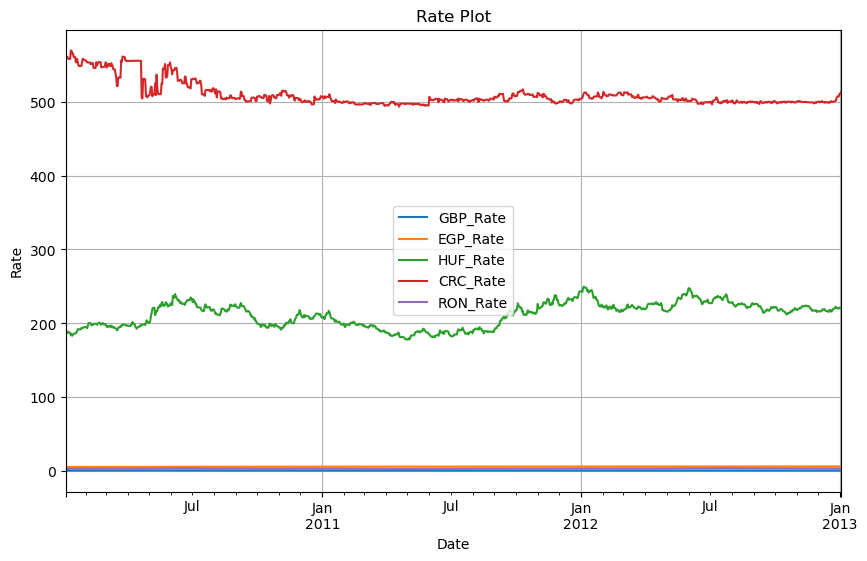

In [316]:
temp.plot(figsize=(10, 6), title='Rate Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

In [317]:
temp.corr()

,GBP_Rate,EGP_Rate,HUF_Rate,CRC_Rate,RON_Rate
GBP_Rate,1.000000,-0.463400,0.473750,0.476666,0.361184
EGP_Rate,-0.463400,1.000000,0.366155,-0.769087,0.427328
HUF_Rate,0.473750,0.366155,1.000000,-0.150183,0.878120
CRC_Rate,0.476666,-0.769087,-0.150183,1.000000,-0.226655
RON_Rate,0.361184,0.427328,0.878120,-0.226655,1.000000


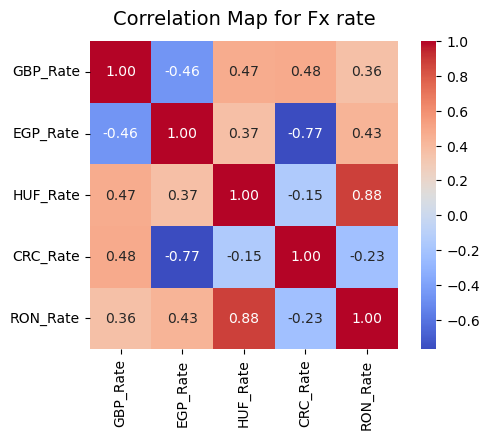

In [318]:
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Fx rate', fontdict={'fontsize': 14}, pad=12)
plt.show()

### 3.2 Bond Price 

Prior to 2013: 
* EGP shows a large amount of small increase when calculating the price difference. Some warning part is that the decrease are substaintial and occuring in year 2012. 
* There is no much data for HUF before 2013, for the small time period, the positive diff are more than the negtaive diff. 
* For CRC, the larger negative difference occured comparing to the positive difference. 
* For RON, it oscillates around 0. 


The correlation is relatively low, suggesting potentially using it to diversify the portfolio. If time allowed, maybe try to invest in different markets with different weights. 

In [319]:
fig = go.Figure()
temp_b = pd.DataFrame()
temp_b['price_diff_EGP'] = EGP_sp.loc[:'2013-01-02','price_1wk']-EGP_sp.loc[:'2013-01-02','price_now']
temp_b['price_diff_HUF'] = HUF_sp.loc[:'2013-01-02','price_1wk']-HUF_sp.loc[:'2013-01-02','price_now']
temp_b['price_diff_CRC'] = CRC_sp.loc[:'2013-01-02','price_1wk']-CRC_sp.loc[:'2013-01-02','price_now']
temp_b['price_diff_RON'] = RON_sp.loc[:'2013-01-02','price_1wk']-RON_sp.loc[:'2013-01-02','price_now']


for c in temp_b.columns:
    fig.add_trace(go.Scatter(
            x=temp_b.index,
            y=temp_b[c],
            mode='lines',  
            name=c,
    ))
fig.update_layout(
    template="none",
    autosize = True,
    title_text='Price Difference Plot',
    showlegend=True 
)
iplot(fig)

##### just in case plot did not show prev

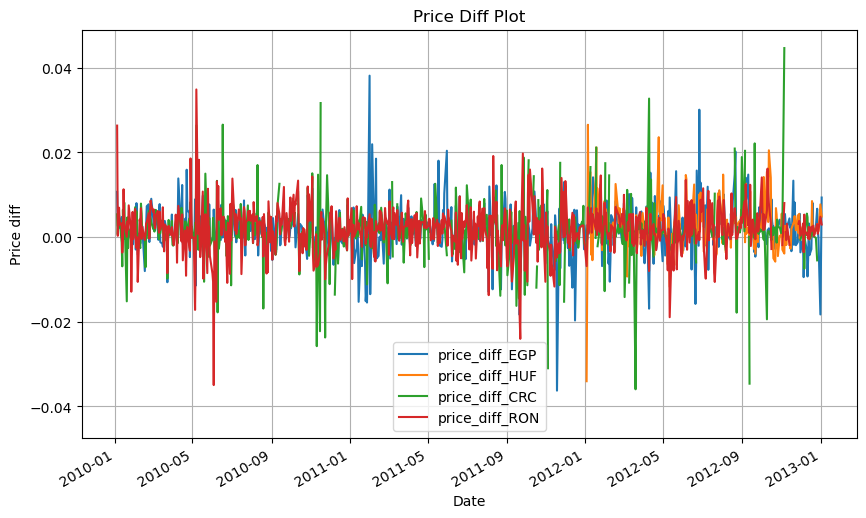

In [320]:
temp_b.plot(figsize=(10, 6), title='Price Diff Plot', xlabel='Date', ylabel='Price diff', grid=True)
plt.legend(loc='best')
plt.show()

In [321]:
temp_b.corr()

,price_diff_EGP,price_diff_HUF,price_diff_CRC,price_diff_RON
price_diff_EGP,1.000000,0.148948,0.137541,0.401846
price_diff_HUF,0.148948,1.000000,0.018050,0.584113
price_diff_CRC,0.137541,0.018050,1.000000,0.247368
price_diff_RON,0.401846,0.584113,0.247368,1.000000


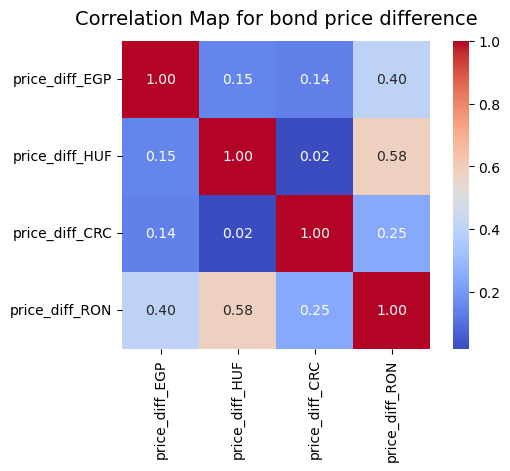

In [322]:
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp_b.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for bond price difference', fontdict={'fontsize': 14}, pad=12)
plt.show()

## 4.Trading Strategy Implementation & Analysis 

**Here, we will majorly implement the trading strategy. Some assumptions we made:**
1. no trading cost 
2. consider Wednesday as the bginning of each week 
3. notional is 10,000,000 USD for each week 
4. all the profit related calculation is in unit USD

**Enter Condition:** 

Weeks in which the 5Y swap rate of the lending currency is less than 50bp higher than the 5Y swap rate in the funding currency will be assumed to have no position, which means that if 5Y SWAP RATE > OIS + 50 + 50, we enter. Otherwise, no position.

**Exist Condition:**

Exist next Wednesday.(sell out all the position)

After running the strategy for four currencies/markets and one joint strategy, I will analyze the performance of the trading strategy one by one: 
* performance metrics and plots 
* original data used/ risk involved 
* ff factors study 
* relationship to the market 

We identify there are two types of risk in our trading strategy: 
1. The currency risk. The risk that GBP will appreciate and the lending currency will depreciate 
2. The interest rate risk. Shown in the spot rate/ bond price. 

### 4.1 EGP

#### 4.1.1 Performance Metrics & Return Plot

The performance summary metrics indicate that the mean return is slightly negative, with a -0.000235 mean return and a volatility of 0.029201. The Sharpe ratio is negative. The maximum drawdown is quite significant, at -0.545033, which signals a substantial decline from peak to trough during the trading period. We can also see a huge drop in cumulative pnl graph from OCT 2016 and reach the minimum around Dec 2016/ Jan 2017. 

The trade length and weeks data suggest that the strategy was tested over a long period (579 weeks), and the strategy was in the market almost every week (578 weeks). This means that if we consider the trading cost, the trading performance will have a worse result than before. 

It's important to note the high kurtosis value of 144.568549, which indicates that the returns have been prone to occasional extreme values or outliers. Additionally, the trade exhibits negative skewness, indicating that the return distribution is skewed to the left with more frequent extreme negative returns than positive ones. Both of those show that during the trading period, we encounter a bad market period and face some risk.

It is not surpise for us, considering this is an Egpyt market. Egypt has experienced significant currency volatility due to political and economic instability, these results could be interpreted as a reflection of the inherent risks of engaging in FX carry trades in a volatile emerging market. The profitability of carry trades often relies on stable or predictable interest rate differentials and low volatility in exchange rates. Egypt, with its susceptibility to abrupt policy shifts, economic reforms, and sensitivity to global market sentiment, can present substantial risks to carry trade strategies.

From the graph, previous points can be shown. The weekly return graph shows that while returns are generally stable, there are a few extreme negative spikes. These could be due to sudden devaluation or policy changes affecting the Egyptian pound, which are not uncommon in emerging markets. 


In [323]:
trade_EGP = run_trade(wed_EGP)

In [324]:
run_trade(wed_EGP,trade_process=False,trade_performance=True,trade_plot=True)

,mean,volatility,sharpe ratio (benchmark = 0),min,max,max drawdown,VaR,CVaR (0.05),Skew,Kurtosis,final return,final pnl,trade length(wk),trade weeks,profit from borrow(rate),profit from lend(rate)
performance summary,-0.000235,0.029201,-0.008058,-0.493466,0.109157,-0.545033,-0.024473,-0.070697,-9.012613,144.568549,-0.000236,-1.362430e+06,579,578,0.510381,0.636678


##### Plot (just in case plotly dont work)

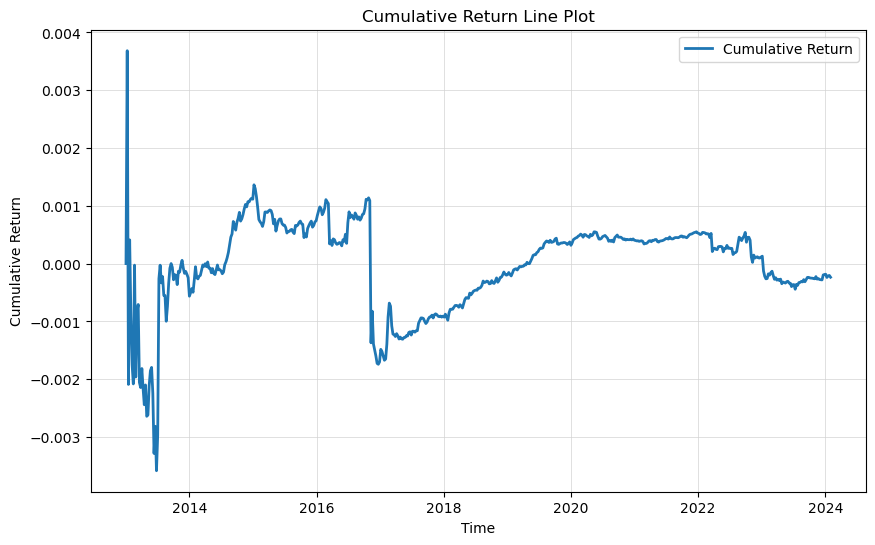

<Figure size 640x480 with 0 Axes>

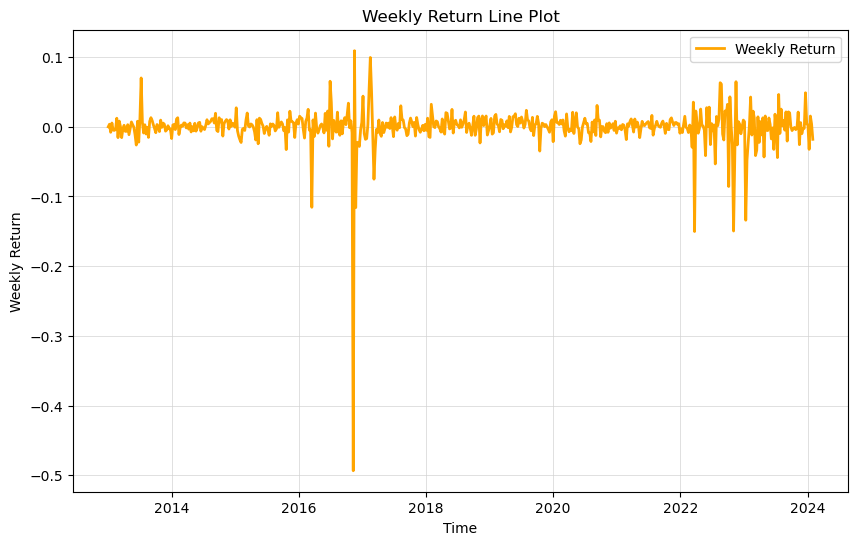

<Figure size 640x480 with 0 Axes>

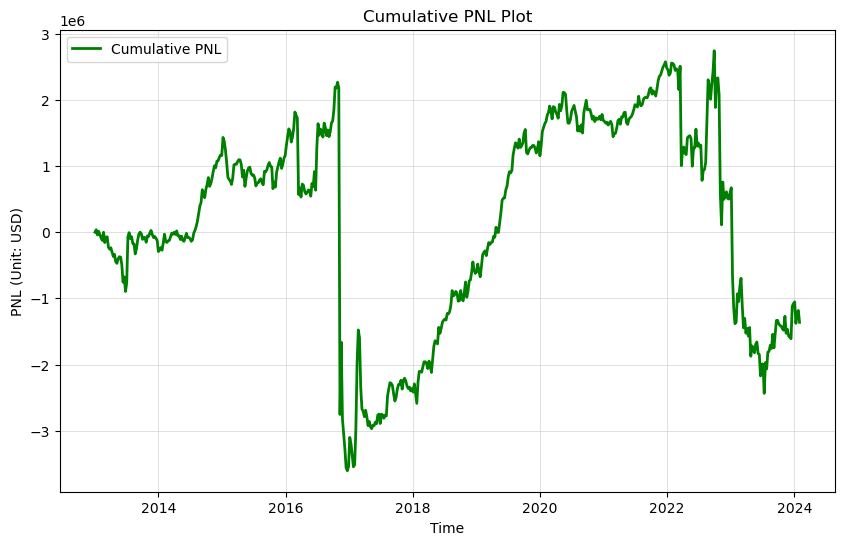

<Figure size 640x480 with 0 Axes>

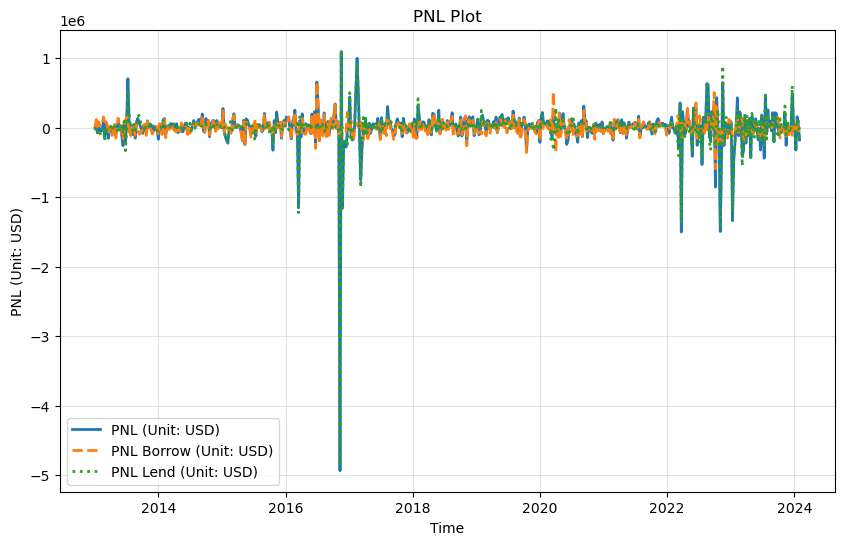

In [325]:
plot(trade_EGP)

#### 4.1.2 bond price

Just as described before, the Egpyt market is quite volatile. This can be also shown in the graph down below. We can see that next week bond price is more volatile changing compared to price now. Remark: the price next week meaning the same bond's price next week. We can see that 2022 -2024 range increases a lot. It might link to Covid period but tehre is no such big change in 2019-2021, making us double thibk the potential reason. Also from the statistic result, we can tell that the mean between those two columns do not have a large differnece, but the standard deviation vaires a lot. For the price now: 0.011558, for the price next week: 0.003588. 

There is no siginificant report related directly about the bond price change in 2022-2024, therefore, the reasons for the sudden change remain unclear. Since the profit majorly comes from the bond price changes, we would say that such more volatile next week bond price might be more beneficial for our trading. 

In [326]:
plot_bond_price(wed_EGP)

In [327]:
wed_EGP['price_1wk'].describe()

count    579.000000
mean       1.002729
std        0.011558
min        0.955595
25%        0.999266
50%        1.001755
75%        1.004260
max        1.095573
Name: price_1wk, dtype: float64

In [328]:
wed_EGP['price_now'].describe()

count    579.000000
mean       1.000699
std        0.003588
min        0.993140
25%        0.999736
50%        0.999824
75%        1.000011
max        1.032086
Name: price_now, dtype: float64

#### 4.1.3 USD/EGP & USD/GBP 

The two FX rates exhibit a notable disparity, prompting me to rescale the USD/GBP for better visibility on the graph. As anticipated, the EGP currency experiences a sharp depreciation from the end of 2016 to 2017, aligning with our earlier observations. A similar trend emerges once more from March 2022 to February 2023, seemingly correlating with patterns in the bond price. However, the graph also reveals significant volatility in the Egyptian currency, suggesting that it may not be a stable market conducive to conducting FX carry trades.

In [329]:
plot_rate(wed_rate,'EGP_Rate')

#### 4.1.4 OIS & spot rate 

Just as we have saw before, the interest rate/ spot rate/ swap rate are higher than Britain for sure. We can see a similar trend between spot_rate and bond price before. It seems like it is not influenced much by the 2016 eonomy crsis in Egypt. 

In [330]:
plot_ir_price(wed_EGP)

#### 4.1.5 FF-factors study 

The EGP carry trade weekly returns are not well explained by the Fama-French three factors for the developed market but show some relationship with market and value factors in the emerging market. The low overall R-squared values suggest that other factors, possibly specific to Egypt's economic or financial conditions, may provide better insights. The significant Omnibus test indicates non-normality in the residuals, which could mean that the model's assumptions are violated, and the high kurtosis observed suggests the presence of outliers or extreme values in the returns. This could affect the model's reliability, and hence alternative models or additional explanatory variables might be needed to better capture the dynamics of EGP carry trade returns.

**Developed-3-ff-factors**

In [331]:
temp1 = ff_factors_dev.loc[:,['Mkt-RF','SMB','HML']]
temp = temp1.copy() 
temp1['ret'] = trade_EGP['return']
#temp1

In [332]:
df_reset = temp1.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)

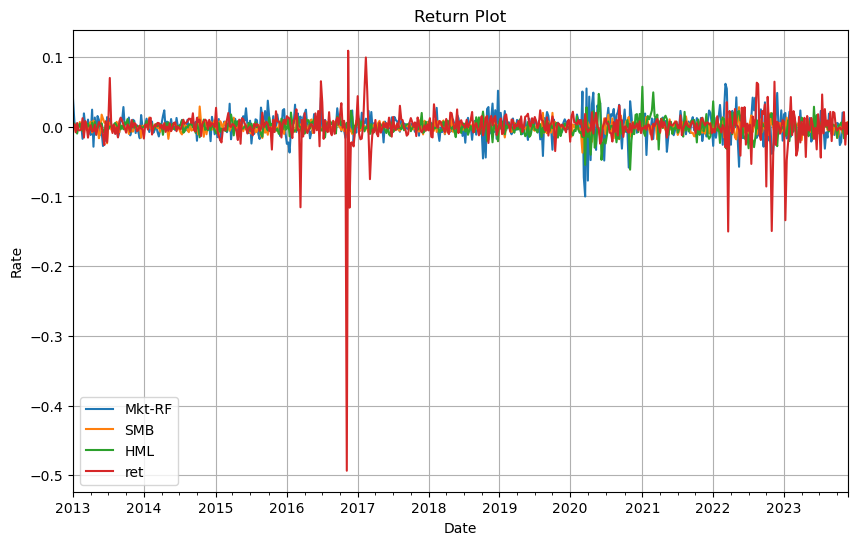

In [333]:
temp1.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

In [334]:
temp1.corr()

,Mkt-RF,SMB,HML,ret
Mkt-RF,1.000000,-0.324105,-0.051086,0.027702
SMB,-0.324105,1.000000,0.083166,0.005332
HML,-0.051086,0.083166,1.000000,-0.053746
ret,0.027702,0.005332,-0.053746,1.000000


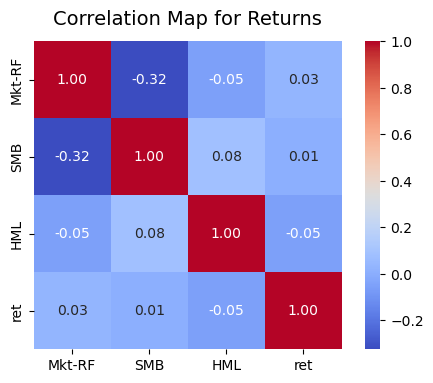

In [335]:
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp1.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()

In [336]:
X = sm.add_constant(temp1.loc[:,['Mkt-RF','SMB','HML']])
Y = temp1['ret']
model = sm.OLS(Y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    ret   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.7328
Date:                Thu, 15 Feb 2024   Prob (F-statistic):              0.533
Time:                        22:52:16   Log-Likelihood:                 1204.8
No. Observations:                 570   AIC:                            -2402.
Df Residuals:                     566   BIC:                            -2384.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0004      0.001     -0.307      0.7

**Emerging-3-ff-factors**

,Mkt-RF,SMB,HML,ret
Mkt-RF,1.000000,-0.233947,0.137397,-0.181223
SMB,-0.233947,1.000000,0.083663,0.075106
HML,0.137397,0.083663,1.000000,0.170439
ret,-0.181223,0.075106,0.170439,1.000000


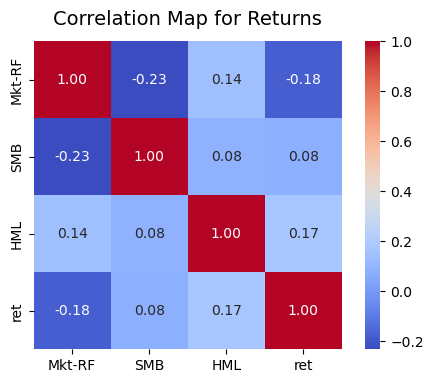

                            OLS Regression Results                            
Dep. Variable:                    ret   R-squared:                       0.072
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                     3.302
Date:                Thu, 15 Feb 2024   Prob (F-statistic):             0.0225
Time:                        22:52:16   Log-Likelihood:                 160.18
No. Observations:                 132   AIC:                            -312.4
Df Residuals:                     128   BIC:                            -300.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0052      0.006      0.795      0.4

In [337]:
temp1 = ff_factors_emerge.loc[:,['Mkt-RF','SMB','HML']]

temp2 = trade_EGP['return'].copy() 
reindexed_returns = temp2.reindex(ff_factors_emerge.index, method='nearest')
temp1['ret'] = reindexed_returns * 4


df_reset = temp1.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(temp1.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp1.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(temp1.loc[:,['Mkt-RF','SMB','HML']])
Y = temp1['ret']
model = sm.OLS(Y, X).fit()
print(model.summary())

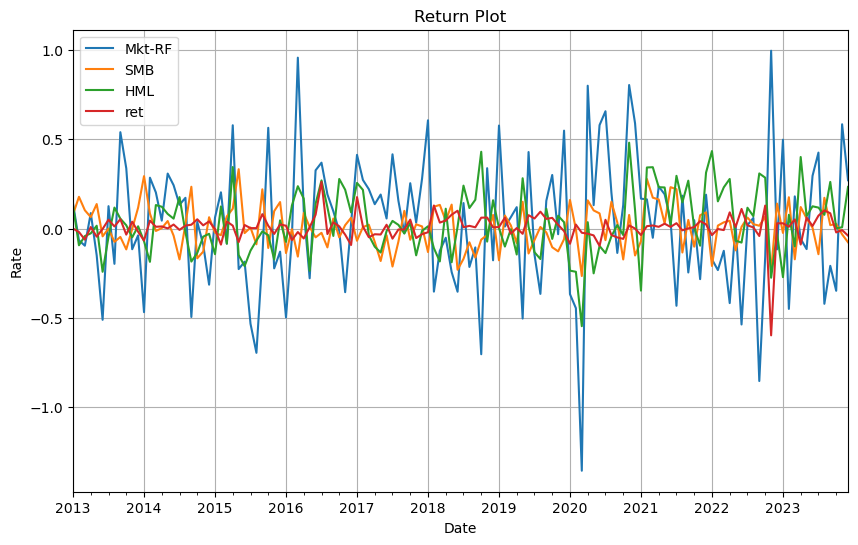

In [338]:
temp1.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

#### 4.1.6 global index 

Here we plan to use these two global index, S&P 500 Index & MSCI Emerging Markets Index. 
We use SPY to represent SPX, and use iShares MSCI Emerging Markets ETF (EEM) as MSCI Emerging. 

From the SPX (using SPY here) persepctive, a low correlation and a low prective power is shown. Since the situation are the same for all the strategies, I will not repeat the conclusion in the later part. 

For the MSCI part, though it is better than SPX,the correlation remains low, and the alpha & beta does not exhibt a huge change compared with SPY. Similarly, the same pattern for all the remaining trading strategies. 

In [339]:
SPY = quandl.get_table('QUOTEMEDIA/PRICES', ticker = 'SPY', date = {'gte':start_date, 'lte':end_date}) 
SPY = SPY.sort_values(by = 'date')
SPY.set_index('date', inplace = True)
df_spy = SPY.loc[:,['adj_close']]
df_spy = check_data(df_spy)
df_spy['return'] = df_spy.pct_change()
df_spy= df_spy.loc['2013-01-01':,['return']]

The start date is 2010-01-06 00:00:00
The end date is 2024-02-07 00:00:00
The shape of the df is (736, 1)


In [340]:
EEM = quandl.get_table('QUOTEMEDIA/PRICES', ticker = 'EEM', date = {'gte':start_date, 'lte':end_date}) 
EEM  = EEM.sort_values(by = 'date')
EEM.set_index('date', inplace = True)
df_eem = EEM.loc[:,['adj_close']]
df_eem = check_data(df_eem)
df_eem['return'] = df_eem.pct_change()
df_eem = df_eem.loc['2013-01-01':,['return']]

The start date is 2010-01-06 00:00:00
The end date is 2024-02-07 00:00:00
The shape of the df is (736, 1)


In [341]:
df_t = trade_EGP.loc[:,['return']].copy() 

In [342]:
df_y = trade_EGP.loc[:,['return']].copy() 

In [343]:
df_t['spy_return'] = df_spy['return'] 

In [344]:
df_y['eem_return'] = df_eem['return'] 

,return,spy_return
return,1.000000,-0.111939
spy_return,-0.111939,1.000000


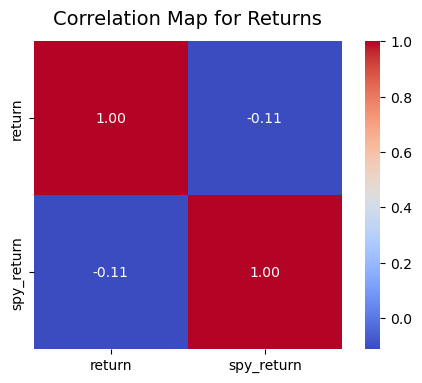

                            OLS Regression Results                            
Dep. Variable:                 return   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     7.322
Date:                Thu, 15 Feb 2024   Prob (F-statistic):            0.00701
Time:                        22:52:18   Log-Likelihood:                 1228.5
No. Observations:                 579   AIC:                            -2453.
Df Residuals:                     577   BIC:                            -2444.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0002      0.001      0.147      0.8

In [345]:
df_reset = df_t.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(df_t.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(df_t.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(df_t.loc[:,['spy_return']])
Y = df_t['return']
model = sm.OLS(Y, X).fit()
print(model.summary())

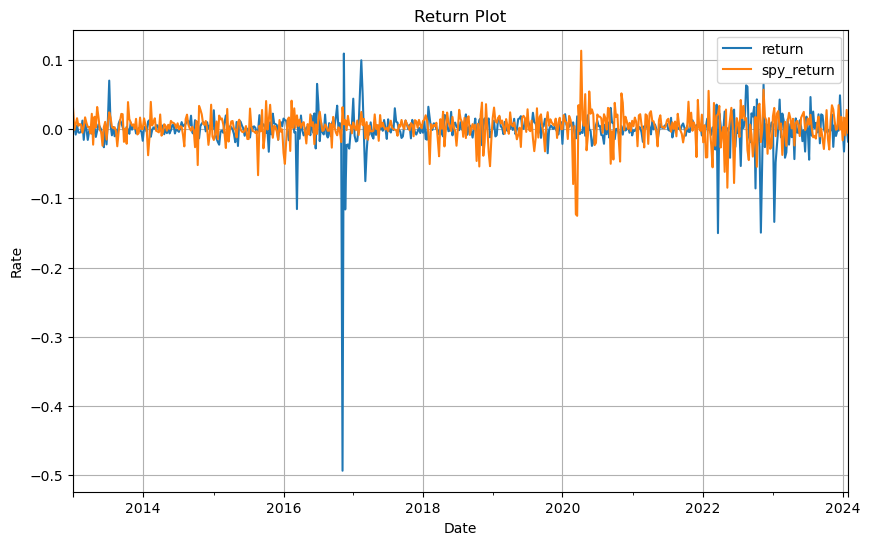

In [346]:
df_t.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

,return,eem_return
return,1.000000,-0.080591
eem_return,-0.080591,1.000000


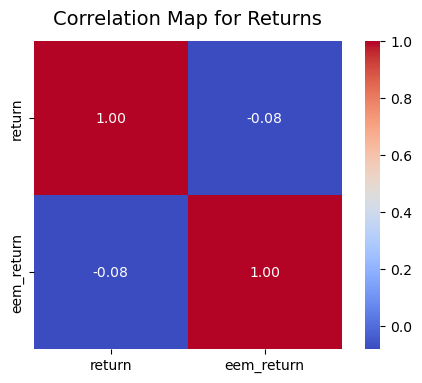

                            OLS Regression Results                            
Dep. Variable:                 return   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     3.772
Date:                Thu, 15 Feb 2024   Prob (F-statistic):             0.0526
Time:                        22:52:19   Log-Likelihood:                 1226.7
No. Observations:                 579   AIC:                            -2449.
Df Residuals:                     577   BIC:                            -2441.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0002      0.001     -0.155      0.8

In [347]:
df_reset = df_y.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(df_y.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(df_y.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(df_y.loc[:,['eem_return']])
Y = df_y['return']
model = sm.OLS(Y, X).fit()
print(model.summary())

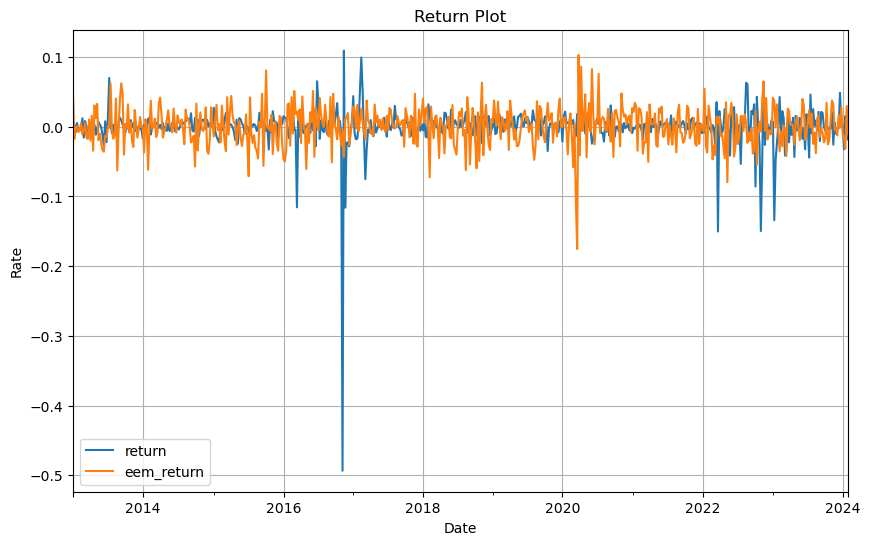

In [348]:
df_y.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

### 4.2 HUF

#### 4.2.1 Performance Metrics & Return Plot

From the performance summary, we observe a slightly positive mean return of 0.000524 and relatively low volatility at 0.01446. The Sharpe ratio is positive at 0.036263, but it is still quite low, indicating that the excess return is not significantly higher than the benchmark 0. This could be due to the low-interest-rate environment or minimal interest rate differentials between the GBP and HUF.

The maximum drawdown is -0.258362, which is less severe compared to the previous analysis of the Egyptian market. This might reflect a more stable or predictable market environment in Hungary, possibly due to more consistent monetary policies or economic conditions.

The trading rate is also very high for HUF carry trade, suggesting the worsen behavior if consideirng the trading cost. The skewness is negative (-0.115426), indicating a distribution of returns that is skewed towards negative outcomes. However, it is less negative than in the previous analysis, suggesting that while losses are more frequent than gains, the difference is not as pronounced. The kurtosis is 1.134881, which is much lower than in the previous analysis and suggests that the return distribution is less prone to extreme values.

In relation to the Hungarian market, the positive final pnl and the relatively stable performance might reflect the economic stability and consistent monetary policies in Hungary over the period analyzed. Hungary has historically had higher interest rates compared to the UK, which could provide a favorable interest rate differential for carry trade strategies. 

The weekly return line plot and cumulative PNL plot show a generally consistent performance with some volatility but no extreme spikes or drops. This could imply that the Hungarian market has not experienced the same level of economic or political instability as seen in other emerging markets. However, the Hungarian market can be affected by regional geopolitical issues or EU-wide economic policies, which can introduce risk factors that need to be considered in such a strategy.


In [349]:
trade_HUF = run_trade(wed_HUF)

In [350]:
run_trade(wed_HUF,trade_process=False,trade_performance=True,trade_plot=True)

,mean,volatility,sharpe ratio (benchmark = 0),min,max,max drawdown,VaR,CVaR (0.05),Skew,Kurtosis,final return,final pnl,trade length(wk),trade weeks,profit from borrow(rate),profit from lend(rate)
performance summary,0.000524,0.01446,0.036263,-0.060678,0.052558,-0.258362,-0.022298,-0.031179,-0.115426,1.134881,0.000535,3.035986e+06,579,568,0.510563,0.52993


##### Plot (just in case plotly dont work)

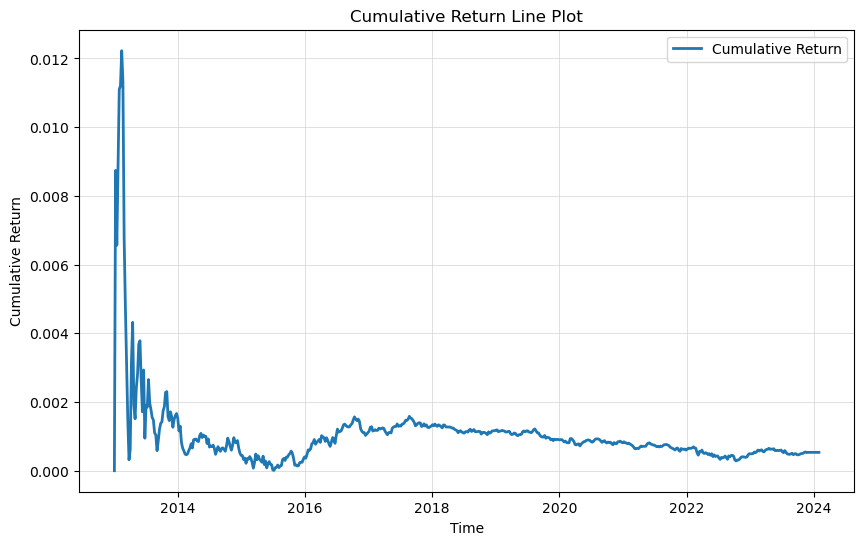

<Figure size 640x480 with 0 Axes>

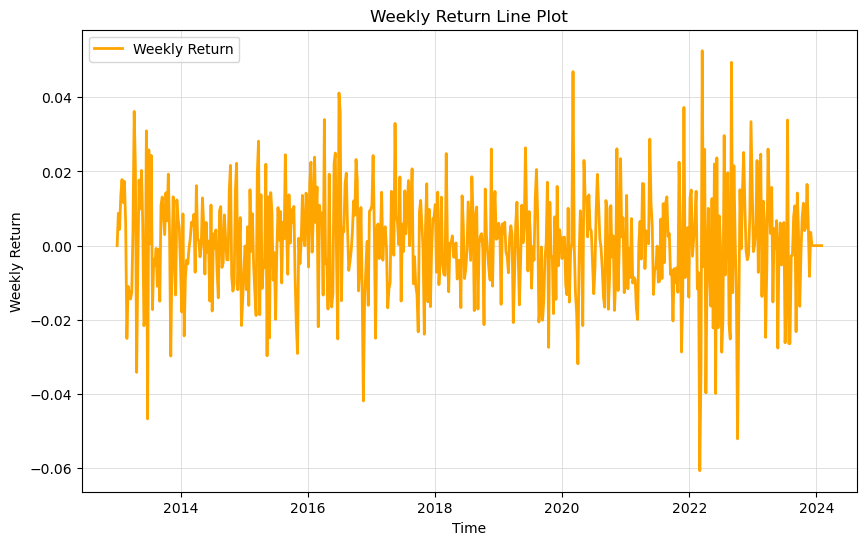

<Figure size 640x480 with 0 Axes>

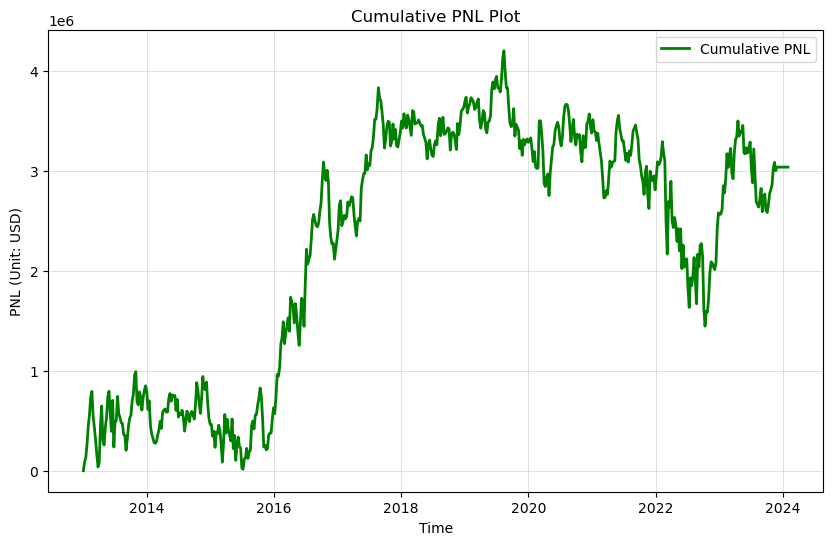

<Figure size 640x480 with 0 Axes>

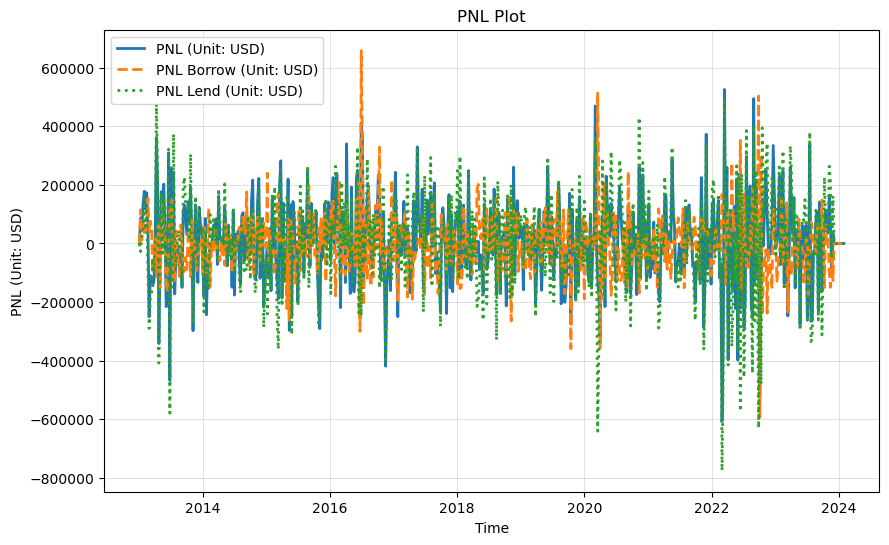

In [351]:
plot(trade_HUF)

#### 4.2.2 bond price

The overall trend in the bond price from 2015 to 2023 is upward, albeit within a relatively narrow range. However, closer examination reveals that the bond price for the upcoming week experiences both significant increases and decreases. Statistical analysis further confirms that, akin to the EGP, the bond price for the next week exhibits higher volatility compared to the overall bond price. This persistent upward trend across all quantiles augments our trading position, enhancing the profitability of lending activities.

In [352]:
plot_bond_price(wed_HUF)

In [353]:
wed_HUF['price_1wk'].describe()

count    579.000000
mean       1.001105
std        0.003319
min        0.976620
25%        0.999573
50%        1.001067
75%        1.002609
max        1.022426
Name: price_1wk, dtype: float64

In [354]:
wed_HUF['price_now'].describe()

count    579.000000
mean       0.999948
std        0.000153
min        0.999537
25%        0.999872
50%        0.999950
75%        0.999996
max        1.000330
Name: price_now, dtype: float64

#### 4.2.3 USD/HUF & USD/GBP 

Given our prior examination of the GBP rate in the preceding section, we will not delve deeply into it here. However, the issue arises with the USD/HUF exchange rate, which exhibits a consistent upward trend. This suggests that the gains from the bond price increase, which we could potentially benefit from through lending, will be diminished. While this trend may not be immediately evident on the graph, if we observe the initial time period, the exchange rate sits around 185, while nearing the end of the trading period, it nearly doubles to almost 360. Such a significant increase significantly diminishes the lending benefits.

In [355]:
plot_rate(wed_rate,'HUF_Rate')

#### 4.2.4 OIS & spot rate 

Here the OIS and spot rate has overlapped time period, meaning the trading chances also decrease. The spot rate of lending country does not exhibit extra benefit. Just as discussed before, there is a period that those two rates are very close. 

In [356]:
plot_ir_price(wed_HUF)

#### 4.2.5 FF-factors study 

The OLS models using Fama-French three factors from both developed and emerging markets do not provide a strong explanation for the weekly returns of the HUF carry trade. The size factor in the emerging market model is an exception, showing some significance and potentially indicating an inverse relationship with small-cap stocks. However, the overall low R-squared values imply that other factors, possibly specific to Hungary's economic or monetary policies, might be more influential in explaining the returns of HUF carry trades. More comprehensive models that include additional macroeconomic factors, currency-specific risks, or other relevant variables could potentially offer a better understanding of the HUF returns.

**Developed-3-ff-factors**

,Mkt-RF,SMB,HML,ret
Mkt-RF,1.000000,-0.324105,-0.051086,0.069393
SMB,-0.324105,1.000000,0.083166,0.027407
HML,-0.051086,0.083166,1.000000,-0.041912
ret,0.069393,0.027407,-0.041912,1.000000


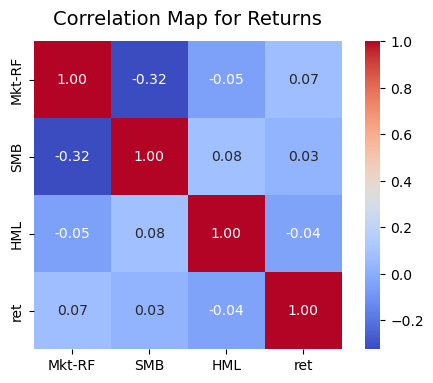

                            OLS Regression Results                            
Dep. Variable:                    ret   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.787
Date:                Thu, 15 Feb 2024   Prob (F-statistic):              0.149
Time:                        22:52:20   Log-Likelihood:                 1604.7
No. Observations:                 570   AIC:                            -3201.
Df Residuals:                     566   BIC:                            -3184.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0005      0.001      0.768      0.4

In [357]:
temp1 = ff_factors_dev.loc[:,['Mkt-RF','SMB','HML']]
temp = temp1.copy() 
temp1['ret'] = trade_HUF['return']
#temp1
df_reset = temp1.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(temp1.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp1.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(temp1.loc[:,['Mkt-RF','SMB','HML']])
Y = temp1['ret']
model = sm.OLS(Y, X).fit()
print(model.summary())

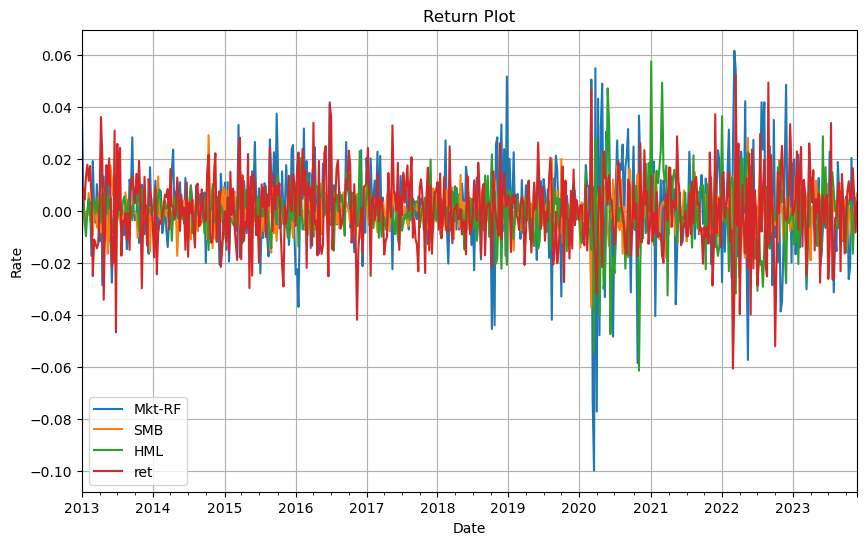

In [358]:
temp1.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

**Emerging-3-ff-factors**

,Mkt-RF,SMB,HML,ret
Mkt-RF,1.000000,-0.233947,0.137397,-0.034442
SMB,-0.233947,1.000000,0.083663,-0.175790
HML,0.137397,0.083663,1.000000,0.040454
ret,-0.034442,-0.175790,0.040454,1.000000


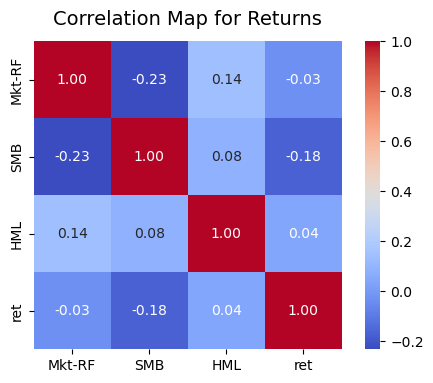

                            OLS Regression Results                            
Dep. Variable:                    ret   R-squared:                       0.042
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     1.856
Date:                Thu, 15 Feb 2024   Prob (F-statistic):              0.140
Time:                        22:52:20   Log-Likelihood:                 181.05
No. Observations:                 132   AIC:                            -354.1
Df Residuals:                     128   BIC:                            -342.6
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0027      0.006      0.480      0.6

In [359]:
temp1 = ff_factors_emerge.loc[:,['Mkt-RF','SMB','HML']]

temp2 = trade_HUF['return'].copy() 
reindexed_returns = temp2.reindex(ff_factors_emerge.index, method='nearest')
temp1['ret'] = reindexed_returns * 4


df_reset = temp1.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(temp1.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp1.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(temp1.loc[:,['Mkt-RF','SMB','HML']])
Y = temp1['ret']
model = sm.OLS(Y, X).fit()
print(model.summary())

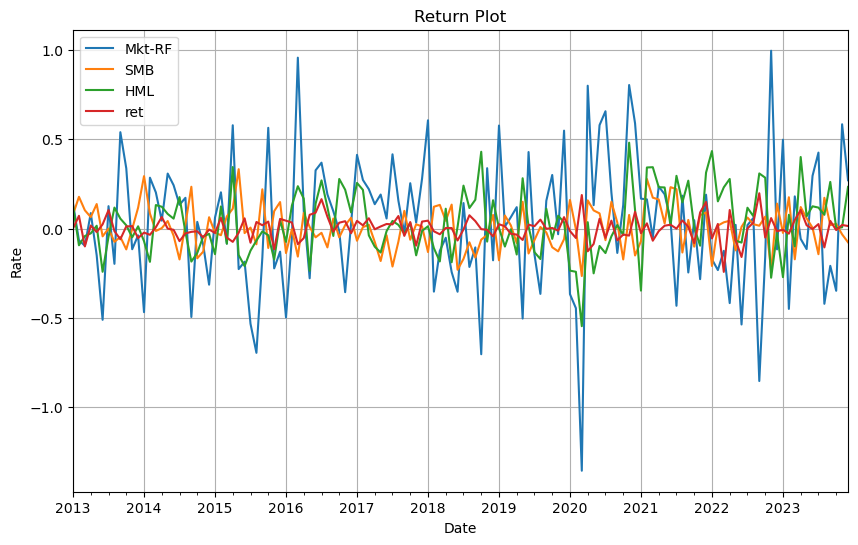

In [360]:
temp1.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

#### 4.2.6 global index 

,return,spy_return
return,1.000000,0.007927
spy_return,0.007927,1.000000


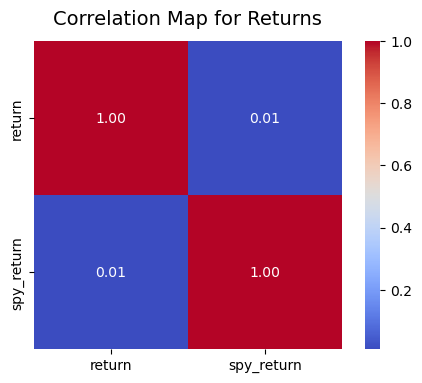

                            OLS Regression Results                            
Dep. Variable:                 return   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                   0.03626
Date:                Thu, 15 Feb 2024   Prob (F-statistic):              0.849
Time:                        22:52:21   Log-Likelihood:                 1631.8
No. Observations:                 579   AIC:                            -3260.
Df Residuals:                     577   BIC:                            -3251.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0005      0.001      0.841      0.4

In [361]:

df_t = trade_HUF.loc[:,['return']].copy() 
df_t['spy_return'] = df_spy['return'] 
df_reset = df_t.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(df_t.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(df_t.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(df_t.loc[:,['spy_return']])
Y = df_t['return']
model = sm.OLS(Y, X).fit()
print(model.summary())

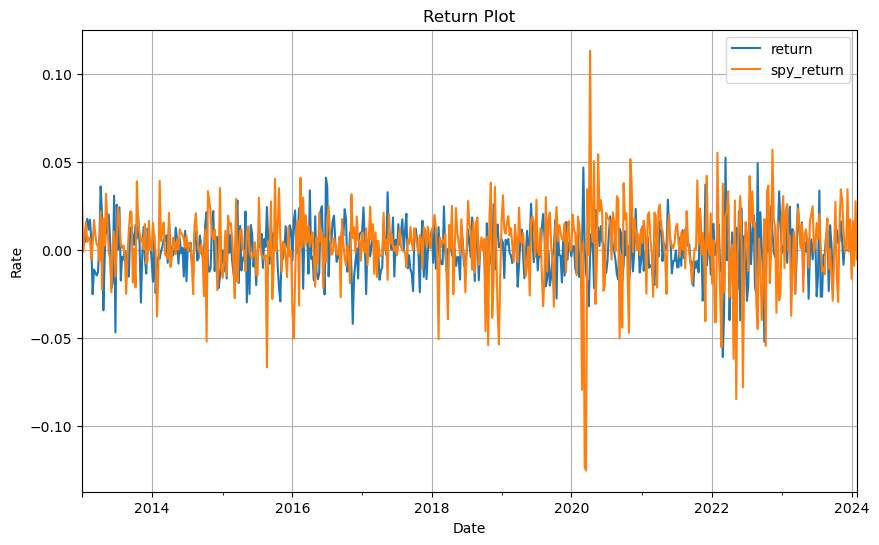

In [362]:
df_t.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

,return,eem_return
return,1.000000,0.106104
eem_return,0.106104,1.000000


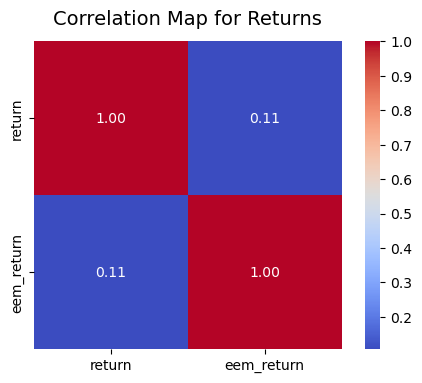

                            OLS Regression Results                            
Dep. Variable:                 return   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     6.570
Date:                Thu, 15 Feb 2024   Prob (F-statistic):             0.0106
Time:                        22:52:21   Log-Likelihood:                 1635.1
No. Observations:                 579   AIC:                            -3266.
Df Residuals:                     577   BIC:                            -3257.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0005      0.001      0.824      0.4

In [363]:
df_y = trade_HUF.loc[:,['return']].copy() 
df_y['eem_return'] = df_eem['return'] 
df_reset = df_y.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(df_y.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(df_y.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(df_y.loc[:,['eem_return']])
Y = df_y['return']
model = sm.OLS(Y, X).fit()
print(model.summary())

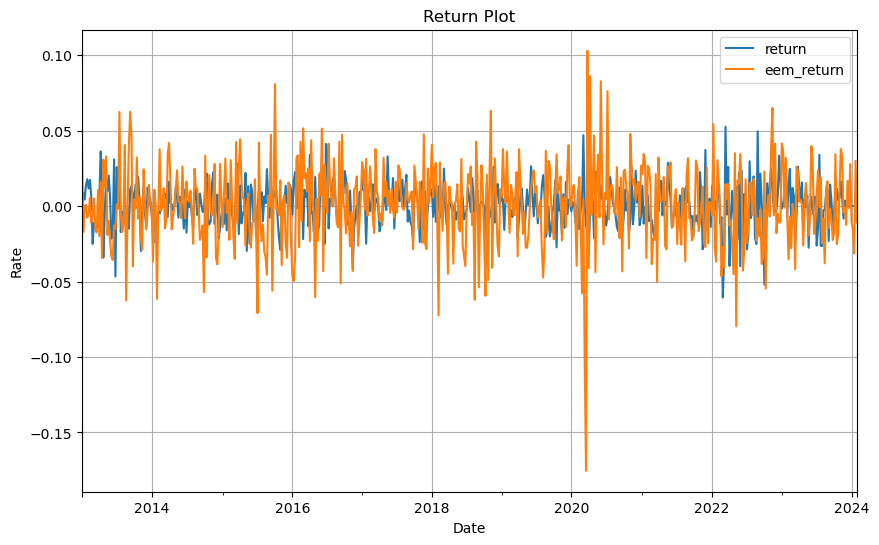

In [364]:
df_y.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

### 4.3 CRC

#### 4.3.1 Performance Metrics & Return Plot

The strategy has a positive mean return of 0.00177, which indicates that on average, the trades were profitable. The volatility of returns is 0.014021, which is relatively low, suggesting that the returns from the strategy did not fluctuate wildly. Though the Sharpe Ratio is not high if we comapring with other protfolio/trading strategy, it is higher than the previous two strategies implemented. 

The maximum drawdown is -0.180914, which reflects the largest drop from peak to trough. This is relatively moderate, indicating that there were no extreme losses over the period.Both Value at Risk and Conditional Value at Risk are relatively small, suggesting that the risk of extreme loss is low. The negative skew (-0.181341) implies that the return distribution has a longer tail to the left, meaning there are instances of extreme losses. A kurtosis of 5.102592 indicates a leptokurtic distribution, meaning there is a higher probability of extreme returns compared to a normal distribution.

Weekly Return: The weekly return plot shows consistent oscillation around the zero line with no clear trend, which suggests that the strategy's weekly performance varied but did not consistently generate large returns. Cumulative PNL demonstrates a general upward trend over time, with some volatility. The overall positive slope is a good sign, indicating profitability throughout the period.

In the context of Costa Rica, the overall positive returns could indicate a favorable interest rate differential exploited by the carry trade. Costa Rica typically has higher interest rates compared to Britain market, which might provide opportunities for FX carry traders to profit from the differential. However, the country's economic stability, inflation rates, and monetary policy changes could influence the viability of these strategies. The moderate maximum drawdown and low VaR/CVaR suggest that the Costa Rican market did not experience extreme volatility during the period analyzed, which is favorable for carry trades.

In [365]:
trade_CRC = run_trade(wed_CRC)

In [366]:
run_trade(wed_CRC,trade_process=False,trade_performance=True,trade_plot=True)

,mean,volatility,sharpe ratio (benchmark = 0),min,max,max drawdown,VaR,CVaR (0.05),Skew,Kurtosis,final return,final pnl,trade length(wk),trade weeks,profit from borrow(rate),profit from lend(rate)
performance summary,0.00177,0.014021,0.126252,-0.089564,0.064266,-0.180914,-0.019543,-0.030369,-0.181341,5.102592,0.001773,1.024934e+07,579,578,0.510381,0.591696


##### Plot (just in case plotly dont work)

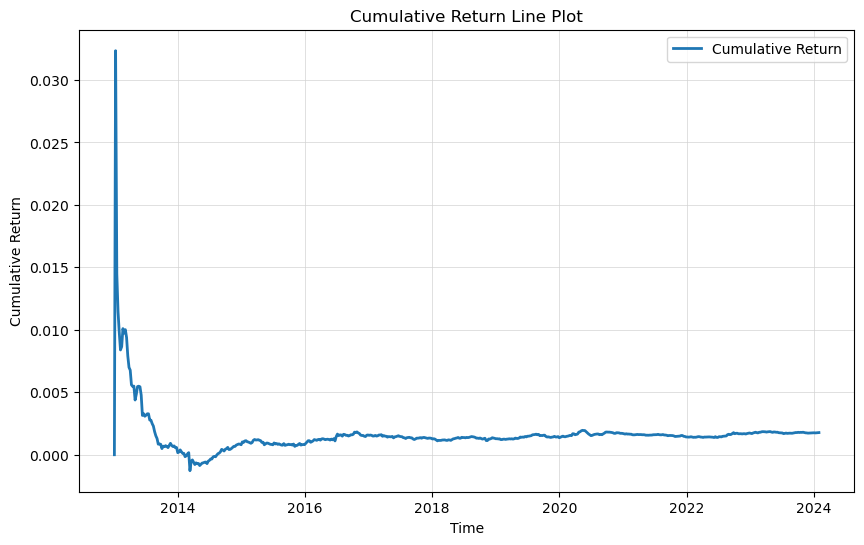

<Figure size 640x480 with 0 Axes>

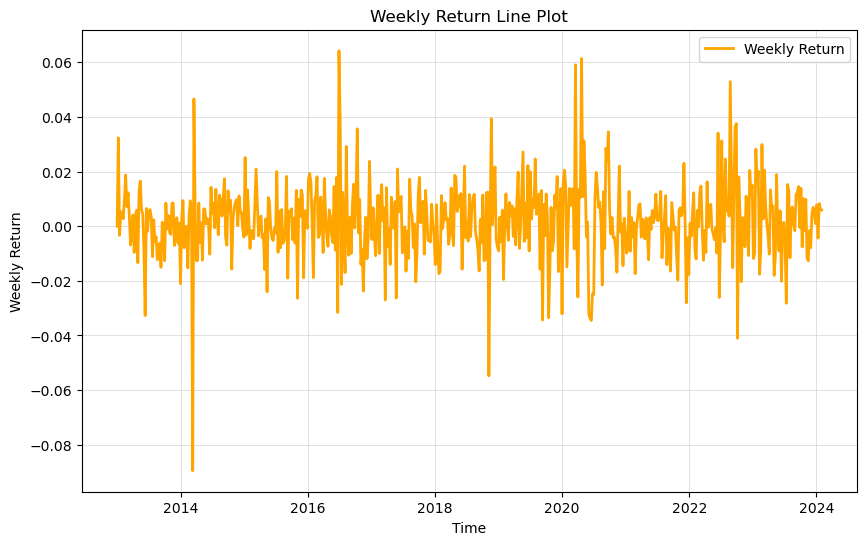

<Figure size 640x480 with 0 Axes>

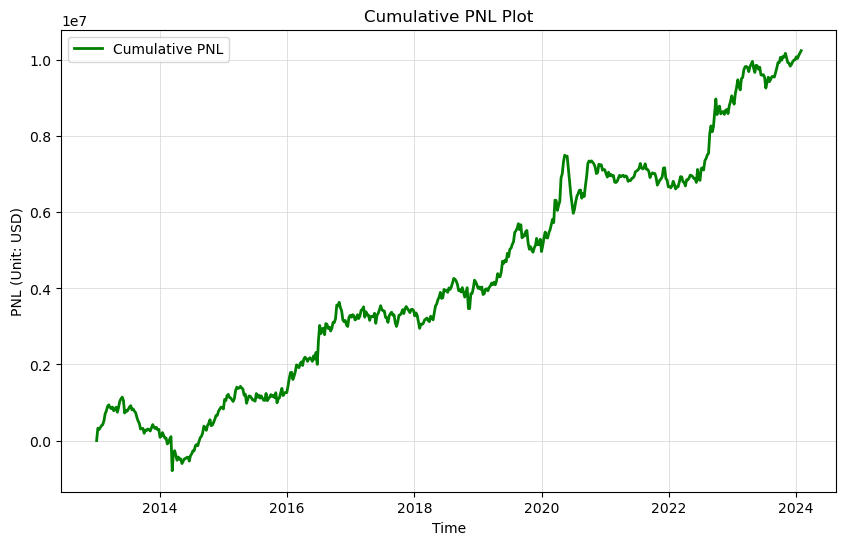

<Figure size 640x480 with 0 Axes>

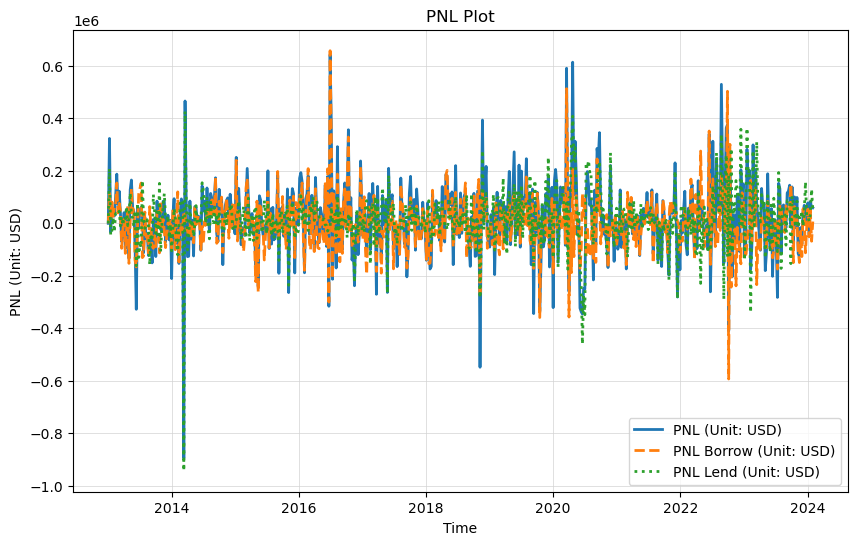

In [367]:
plot(trade_CRC)

#### 4.3.2 bond price

If we examine the bond price depicted in the graph below, we notice a substantial increase, indicating a degree of volatility that might not be conducive to FX carry strategies. The bond price exhibits notable fluctuations, evident both visually in the plot and quantitatively in the statistics. Nevertheless, there are instances where the price decrease is more frequent compared to previous weeks, indicating fluctuations in market conditions.

In [368]:
plot_bond_price(wed_CRC)

In [369]:
wed_CRC['price_now'].describe()

count    579.000000
mean       1.000028
std        0.000552
min        0.999255
25%        0.999713
50%        0.999891
75%        1.000028
max        1.001647
Name: price_now, dtype: float64

In [370]:
wed_CRC['price_1wk'].describe()

count    579.000000
mean       1.001711
std        0.006339
min        0.957707
25%        0.999793
50%        1.001759
75%        1.003794
max        1.030697
Name: price_1wk, dtype: float64

#### 4.3.3 USD/CRC & USD/GBP 

However, there is a decreasing trend of the USD/CRC, which would be beneficial for the FX Carry trade. 

In [371]:
plot_rate(wed_rate,'CRC_Rate')

#### 4.3.4 OIS & spot rate 

When the lending country's interest rate exceeds that of the borrowing country, it often leads to a situation where we engage in trades throughout the entire trading interval. This condition typically arises due to the favorable interest rate differential, incentivizing continual trading activities aimed at maximizing profit from the interest rate spread.

In [372]:
plot_ir_price(wed_CRC)

#### 4.3.5 FF-factors study 

**Developed-3-ff-factors**

Mkt-RF: The coefficient for the market excess return is positive but not statistically significant, suggesting that the market factor does not have a strong predictive power for EGP returns in this model.

SMB: The size premium factor also has a positive coefficient but is not significant.

HML: The value factor has a negative coefficient that is statistically significant, indicating that value stocks inversely affect EGP returns.

Alpha: an extremely small alpha shows the poor performance. It seems it does not suitable for using the devloped countries' factors. 

Or from the developed perspective, it does not seem to be a good way of predicting. 


,Mkt-RF,SMB,HML,ret
Mkt-RF,1.000000,-0.324105,-0.051086,0.022720
SMB,-0.324105,1.000000,0.083166,-0.012004
HML,-0.051086,0.083166,1.000000,-0.096547
ret,0.022720,-0.012004,-0.096547,1.000000


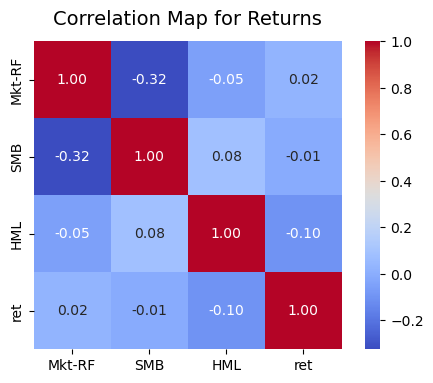

                            OLS Regression Results                            
Dep. Variable:                    ret   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.837
Date:                Thu, 15 Feb 2024   Prob (F-statistic):              0.139
Time:                        22:52:23   Log-Likelihood:                 1622.8
No. Observations:                 570   AIC:                            -3238.
Df Residuals:                     566   BIC:                            -3220.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0016      0.001      2.770      0.0

In [373]:
temp1 = ff_factors_dev.loc[:,['Mkt-RF','SMB','HML']]
temp = temp1.copy() 
temp1['ret'] = trade_CRC['return']
#temp1
df_reset = temp1.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(temp1.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp1.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(temp1.loc[:,['Mkt-RF','SMB','HML']])
Y = temp1['ret']
model = sm.OLS(Y, X).fit()
print(model.summary())

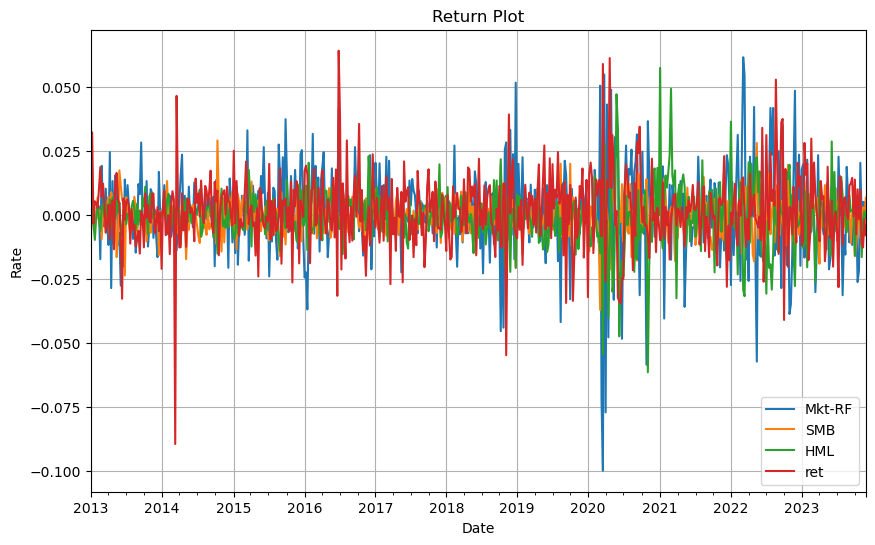

In [374]:
temp1.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

**Emerging-3-ff-factors**

Mkt-RF: The market factor has a negative coefficient and is statistically significant (p-value: 0.108), suggesting that there may be an inverse relationship between global emerging market returns and EGP carry trade returns.

SMB: The size premium is also negative with a p-value of 0.168, which is not significant at conventional levels.

HML: The value factor has a positive but not statistically significant coefficient (p-value: 0.266).

However, the alpha using emerging 3 ff factors are better than using the developed 3 ff factors, which suits our expectation. 

,Mkt-RF,SMB,HML,ret
Mkt-RF,1.000000,-0.233947,0.137397,-0.103893
SMB,-0.233947,1.000000,0.083663,-0.082224
HML,0.137397,0.083663,1.000000,0.068175
ret,-0.103893,-0.082224,0.068175,1.000000


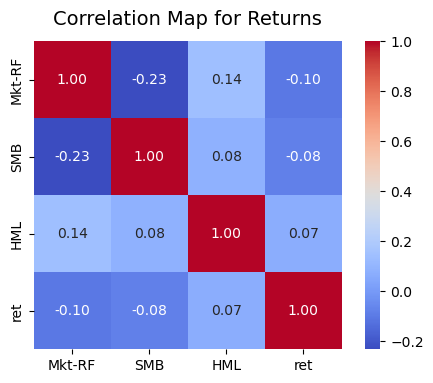

                            OLS Regression Results                            
Dep. Variable:                    ret   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     1.421
Date:                Thu, 15 Feb 2024   Prob (F-statistic):              0.240
Time:                        22:52:23   Log-Likelihood:                 203.52
No. Observations:                 132   AIC:                            -399.0
Df Residuals:                     128   BIC:                            -387.5
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0029      0.005      0.632      0.5

In [375]:
temp1 = ff_factors_emerge.loc[:,['Mkt-RF','SMB','HML']]

temp2 = trade_CRC['return'].copy() 
reindexed_returns = temp2.reindex(ff_factors_emerge.index, method='nearest')
temp1['ret'] = reindexed_returns * 4


df_reset = temp1.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(temp1.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp1.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(temp1.loc[:,['Mkt-RF','SMB','HML']])
Y = temp1['ret']
model = sm.OLS(Y, X).fit()
print(model.summary())

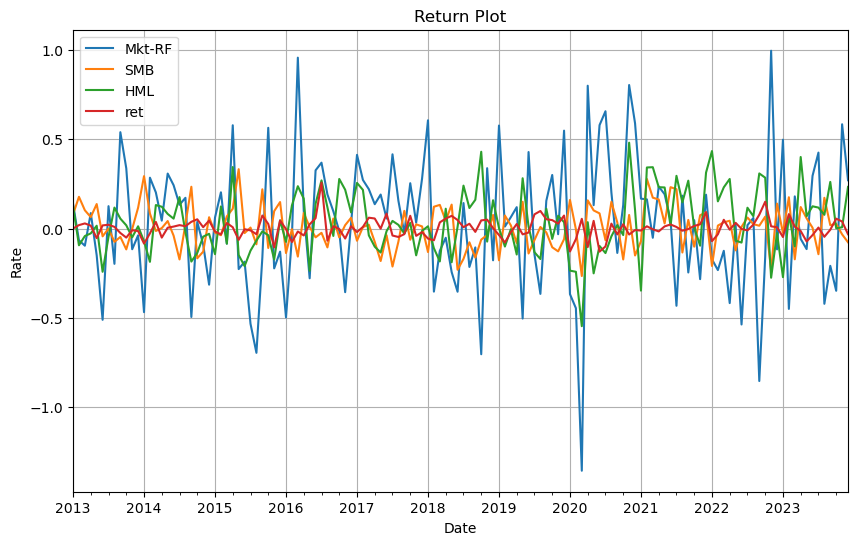

In [376]:
temp1.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

#### 4.3.6 global index 

,return,spy_return
return,1.000000,-0.210287
spy_return,-0.210287,1.000000


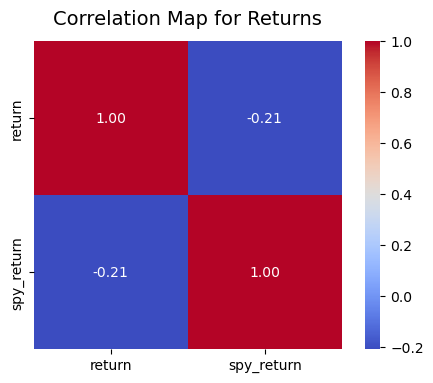

                            OLS Regression Results                            
Dep. Variable:                 return   R-squared:                       0.044
Model:                            OLS   Adj. R-squared:                  0.043
Method:                 Least Squares   F-statistic:                     26.70
Date:                Thu, 15 Feb 2024   Prob (F-statistic):           3.29e-07
Time:                        22:52:23   Log-Likelihood:                 1662.7
No. Observations:                 579   AIC:                            -3321.
Df Residuals:                     577   BIC:                            -3313.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0021      0.001      3.730      0.0

In [377]:

df_t = trade_CRC.loc[:,['return']].copy() 
df_t['spy_return'] = df_spy['return'] 
df_reset = df_t.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(df_t.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(df_t.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(df_t.loc[:,['spy_return']])
Y = df_t['return']
model = sm.OLS(Y, X).fit()
print(model.summary())

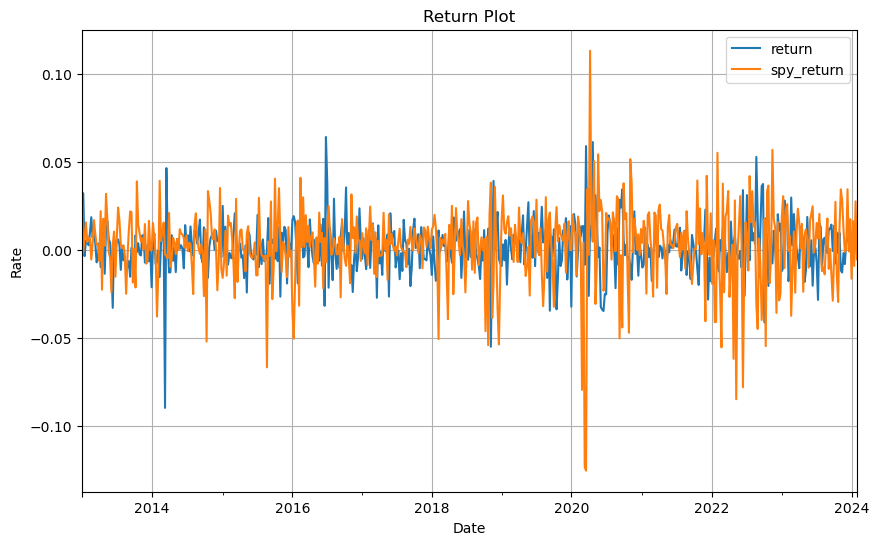

In [378]:
df_t.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

,return,eem_return
return,1.000000,-0.212038
eem_return,-0.212038,1.000000


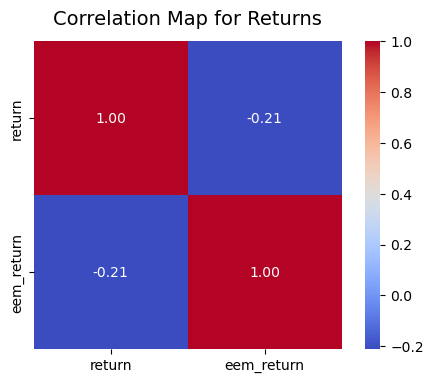

                            OLS Regression Results                            
Dep. Variable:                 return   R-squared:                       0.045
Model:                            OLS   Adj. R-squared:                  0.043
Method:                 Least Squares   F-statistic:                     27.16
Date:                Thu, 15 Feb 2024   Prob (F-statistic):           2.61e-07
Time:                        22:52:24   Log-Likelihood:                 1663.0
No. Observations:                 579   AIC:                            -3322.
Df Residuals:                     577   BIC:                            -3313.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0018      0.001      3.212      0.0

In [379]:
df_y = trade_CRC.loc[:,['return']].copy() 
df_y['eem_return'] = df_eem['return'] 
df_reset = df_y.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(df_y.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(df_y.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(df_y.loc[:,['eem_return']])
Y = df_y['return']
model = sm.OLS(Y, X).fit()
print(model.summary())

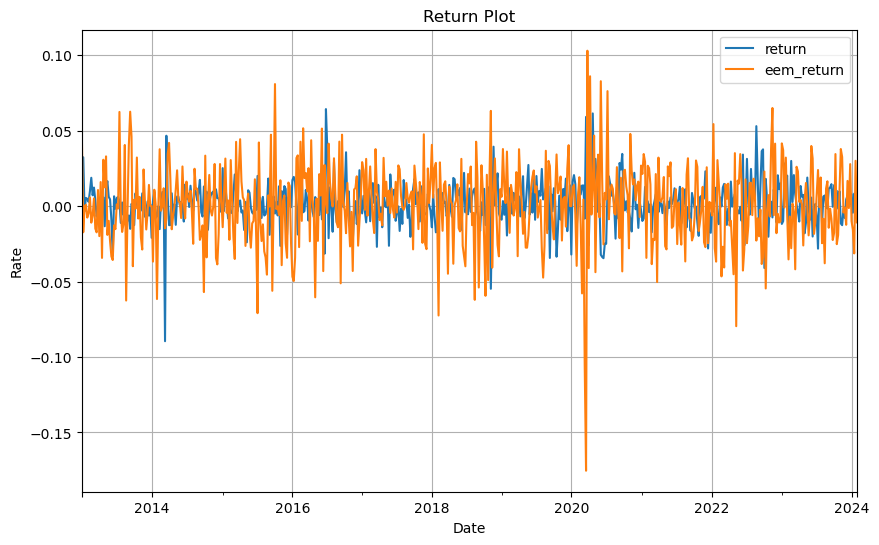

In [380]:
df_y.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

### 4.4 RON

#### 4.4.1 Performance Metrics & Return Plot

The strategy yielded a modest mean return of 0.000616, indicating that it generated positive returns on average. With a volatility of 0.010712, the returns experienced low fluctuation. A positive sharpe ratio is acceptable. The maximum drawdown of -0.123487 signifies that the strategy saw a moderate decline from peak to trough without catastrophic losses. The low VaR and CVaR values suggest that there was a relatively low risk of extreme losses at the given confidence level. The skewness is positive, suggesting a longer tail to the right of the mean, indicating occasional larger returns. A kurtosis of 1.491397 suggests a distribution that is less prone to extreme values compared to a normal distribution.

This weekly return plot shows a high frequency of both positive and negative returns with no discernible long-term trend, implying variability in weekly performance without a steady direction of profitability. The cumulative PNL plot exhibits a general upward trend, indicating the overall profitability of the strategy, with some periods of plateau and mild fluctuations.

The period from 2013 to 2024 for the RON market would have seen various economic changes, including potential impacts from EU economic policies, regional geopolitical developments, and internal economic reforms. The early gains in the strategy might coincide with periods of favorable interest rate differentials between the GBP and RON or periods of economic stability in Romania.

The positive mean return and overall positive final pnl suggest that the carry trade strategy was able to capitalize on such differentials. However, the moderate maximum drawdown and the variability seen in the weekly returns highlight the importance of considering market volatility and potential economic or political events that could affect the RON's stability.

In [381]:
trade_RON = run_trade(wed_RON)

In [382]:
run_trade(wed_RON,trade_process=False,trade_performance=True,trade_plot=True)

,mean,volatility,sharpe ratio (benchmark = 0),min,max,max drawdown,VaR,CVaR (0.05),Skew,Kurtosis,final return,final pnl,trade length(wk),trade weeks,profit from borrow(rate),profit from lend(rate)
performance summary,0.000616,0.010712,0.05746,-0.033664,0.047851,-0.123487,-0.015477,-0.021298,0.320268,1.491397,0.000625,3.563987e+06,579,570,0.512281,0.524561


##### Plot (just in case plotly dont work)

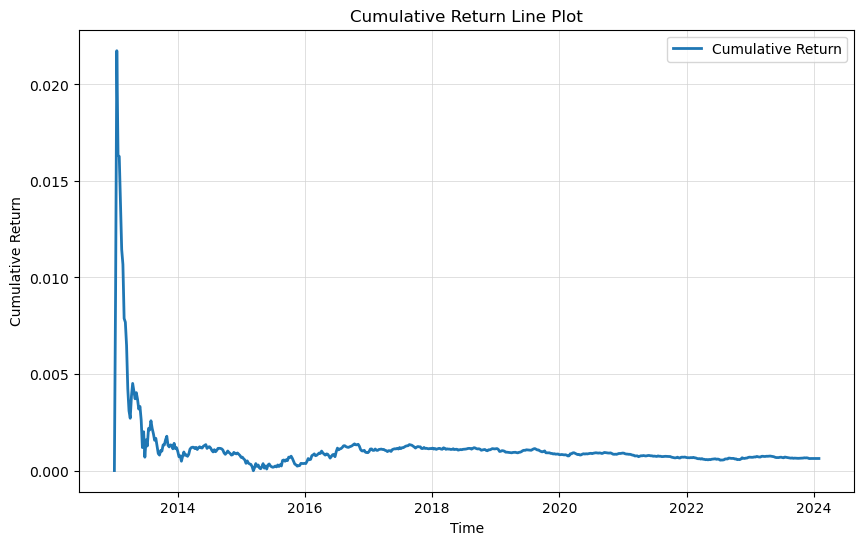

<Figure size 640x480 with 0 Axes>

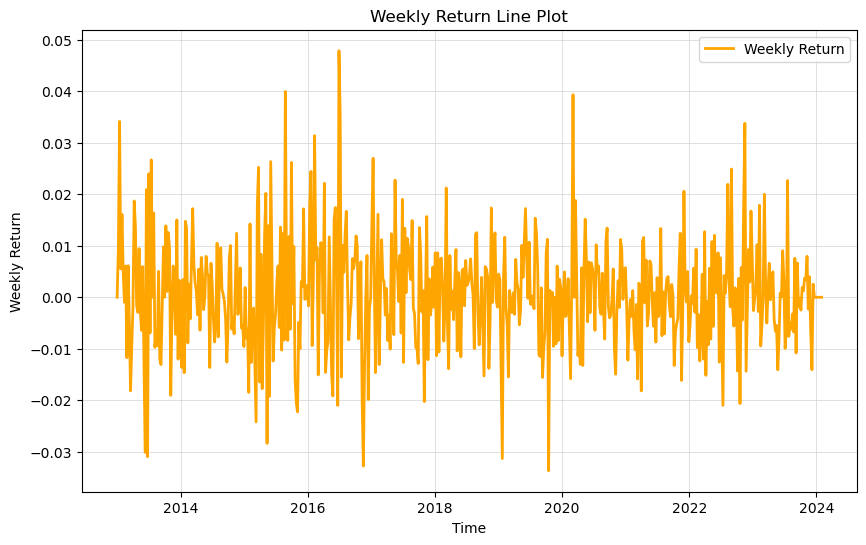

<Figure size 640x480 with 0 Axes>

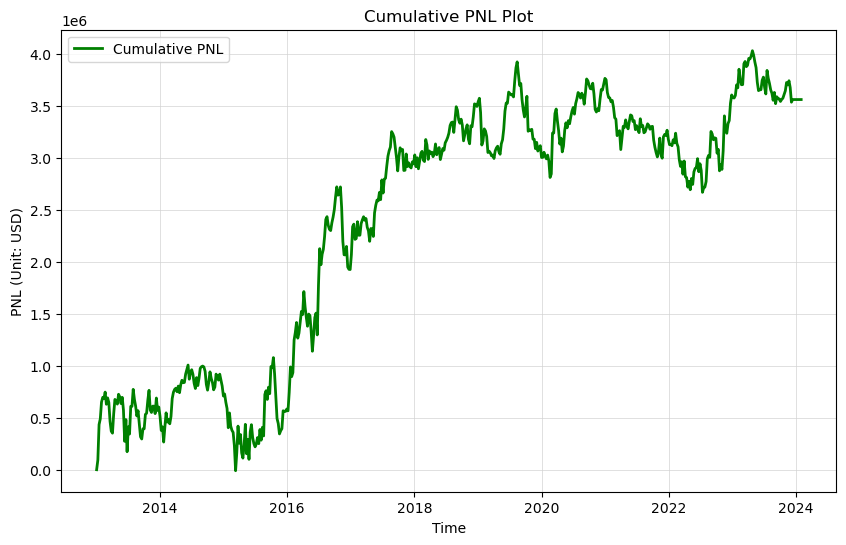

<Figure size 640x480 with 0 Axes>

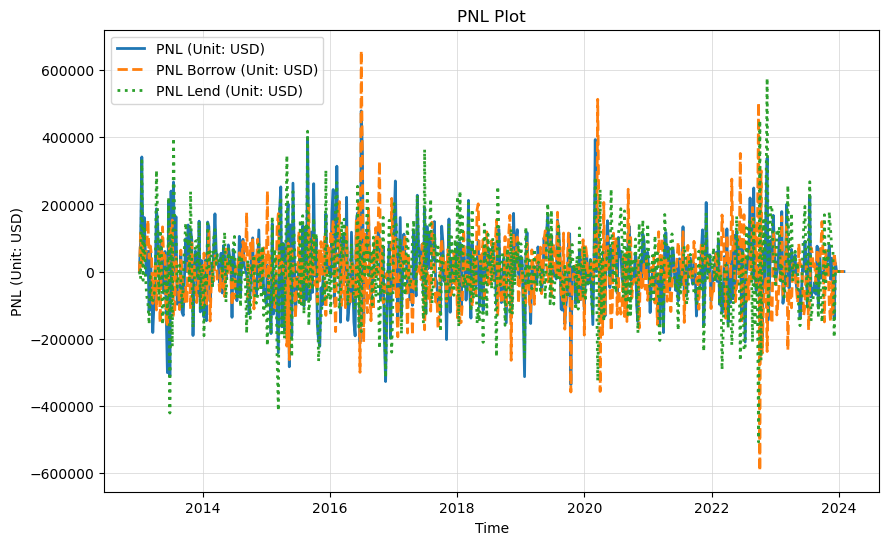

In [383]:
plot(trade_RON)

#### 4.4.2 bond price

The bond price between 2022 and 2024 exhibits volatility, as depicted by the fluctuations in the blue line. Upon closer inspection, we notice a consistent upward trajectory in the bond price. Comparing it with the next week's bond price, the general pattern reveals a few significant increases interspersed with numerous smaller increases and decreases. This observation aligns with the statistical analysis, particularly evident in the standard deviation, highlighting disparities in volatility between different periods.

In [384]:
plot_bond_price(wed_RON)

In [385]:
wed_RON['price_1wk'].describe()

count    579.000000
mean       1.001019
std        0.003366
min        0.981830
25%        0.999401
50%        1.000950
75%        1.002518
max        1.032863
Name: price_1wk, dtype: float64

In [386]:
wed_RON['price_now'].describe()

count    579.000000
mean       0.999950
std        0.000104
min        0.999672
25%        0.999900
50%        0.999952
75%        0.999989
max        1.000325
Name: price_now, dtype: float64

#### 4.4.3 USD/RON & USD/GBP 

The FX rate shows a general increasing trend, but not so much in scale, whihc is better than HUF. 

In [387]:
plot_rate(wed_rate,'RON_Rate')

#### 4.4.4 OIS & spot rate 

We miss only a few trading opportunities, but from the graph, we can tell that some time, there is no large difference in the rate plot. 

In [388]:
plot_ir_price(wed_RON)

#### 4.4.5 FF-factors study 

Like the EGP model, the RON carry trade models with Fama-French factors from developed and emerging markets do not provide strong predictive power for the weekly returns. The SMB factor in the emerging market model shows some significance, which may suggest that smaller capitalization markets are inversely related to RON returns, but overall, the model's low R-squared values indicate that other factors, perhaps specific to the Romanian market or to the carry trade strategy itself, are likely to be better predictors of returns. It may be beneficial to consider country-specific risk factors, macroeconomic variables, or other data that might affect the currency markets in Romania to improve model fit. Similarly, the emerging one has a larger alpha comparing for the developed one. 

**Developed-3-ff-factors**

,Mkt-RF,SMB,HML,ret
Mkt-RF,1.000000,-0.324105,-0.051086,0.012271
SMB,-0.324105,1.000000,0.083166,0.014309
HML,-0.051086,0.083166,1.000000,-0.030875
ret,0.012271,0.014309,-0.030875,1.000000


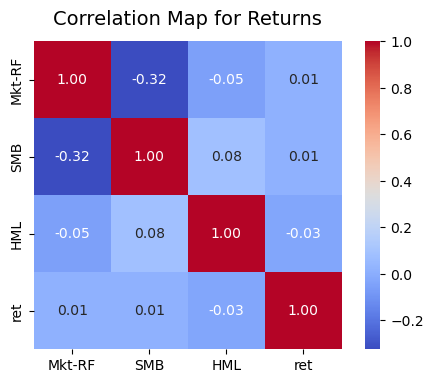

                            OLS Regression Results                            
Dep. Variable:                    ret   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.2893
Date:                Thu, 15 Feb 2024   Prob (F-statistic):              0.833
Time:                        22:52:25   Log-Likelihood:                 1774.3
No. Observations:                 570   AIC:                            -3541.
Df Residuals:                     566   BIC:                            -3523.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0006      0.000      1.390      0.1

In [389]:
temp1 = ff_factors_dev.loc[:,['Mkt-RF','SMB','HML']]
temp = temp1.copy() 
temp1['ret'] = trade_RON['return']
#temp1
df_reset = temp1.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(temp1.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp1.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(temp1.loc[:,['Mkt-RF','SMB','HML']])
Y = temp1['ret']
model = sm.OLS(Y, X).fit()
print(model.summary())

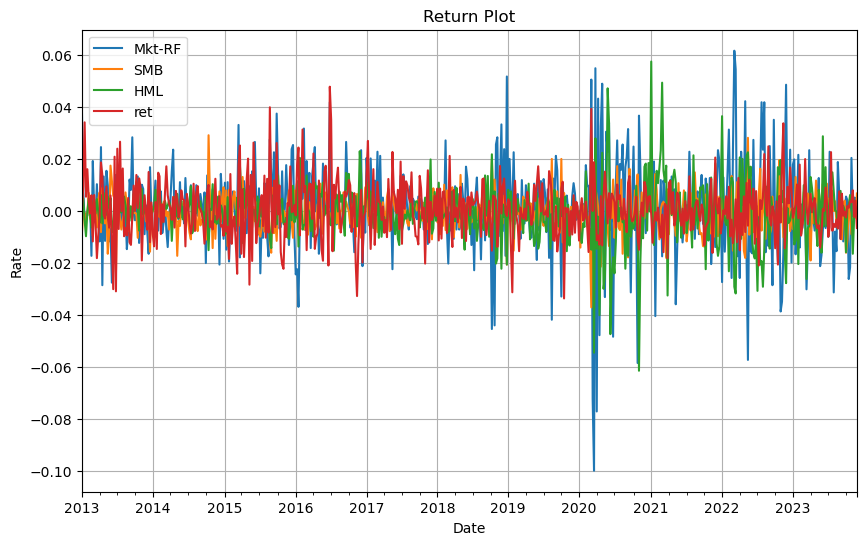

In [390]:
temp1.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

**Emerging-3-ff-factors**

,Mkt-RF,SMB,HML,ret
Mkt-RF,1.000000,-0.233947,0.137397,-0.097861
SMB,-0.233947,1.000000,0.083663,-0.198950
HML,0.137397,0.083663,1.000000,-0.075036
ret,-0.097861,-0.198950,-0.075036,1.000000


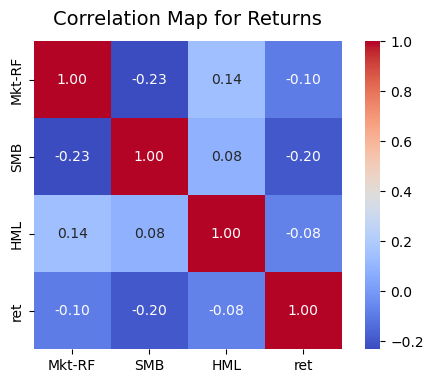

                            OLS Regression Results                            
Dep. Variable:                    ret   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.041
Method:                 Least Squares   F-statistic:                     2.862
Date:                Thu, 15 Feb 2024   Prob (F-statistic):             0.0394
Time:                        22:52:26   Log-Likelihood:                 232.39
No. Observations:                 132   AIC:                            -456.8
Df Residuals:                     128   BIC:                            -445.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0103      0.004      2.754      0.0

In [391]:
temp1 = ff_factors_emerge.loc[:,['Mkt-RF','SMB','HML']]

temp2 = trade_RON['return'].copy() 
reindexed_returns = temp2.reindex(ff_factors_emerge.index, method='nearest')
temp1['ret'] = reindexed_returns * 4


df_reset = temp1.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(temp1.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp1.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(temp1.loc[:,['Mkt-RF','SMB','HML']])
Y = temp1['ret']
model = sm.OLS(Y, X).fit()
print(model.summary())

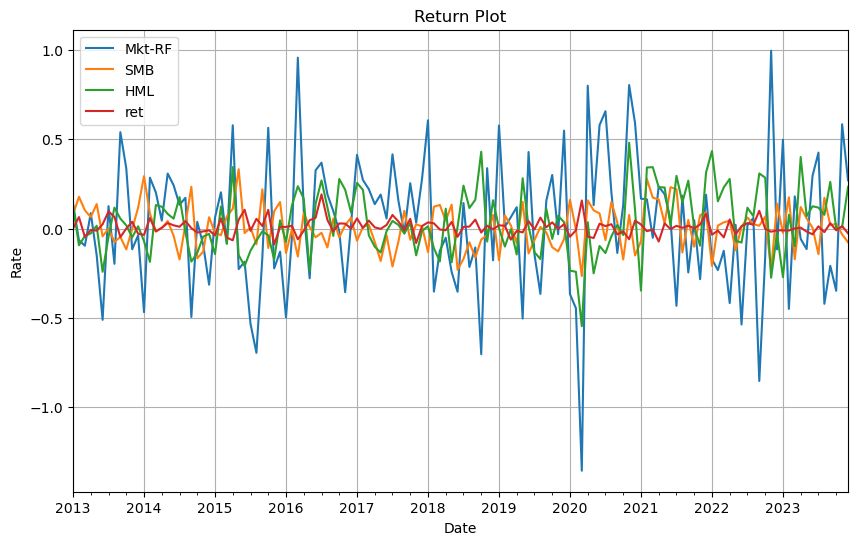

In [392]:
temp1.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

#### 4.4.6 global index 

,return,spy_return
return,1.00000,-0.15204
spy_return,-0.15204,1.00000


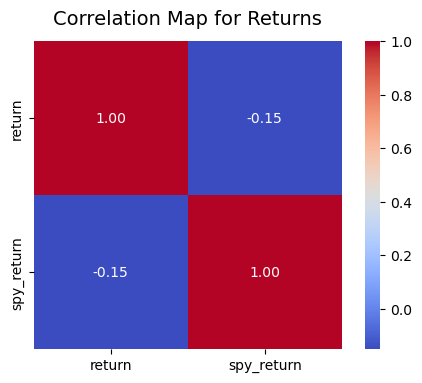

                            OLS Regression Results                            
Dep. Variable:                 return   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     13.65
Date:                Thu, 15 Feb 2024   Prob (F-statistic):           0.000241
Time:                        22:52:26   Log-Likelihood:                 1812.2
No. Observations:                 579   AIC:                            -3620.
Df Residuals:                     577   BIC:                            -3612.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0008      0.000      1.851      0.0

In [393]:

df_t = trade_RON.loc[:,['return']].copy() 
df_t['spy_return'] = df_spy['return'] 
df_reset = df_t.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(df_t.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(df_t.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(df_t.loc[:,['spy_return']])
Y = df_t['return']
model = sm.OLS(Y, X).fit()
print(model.summary())

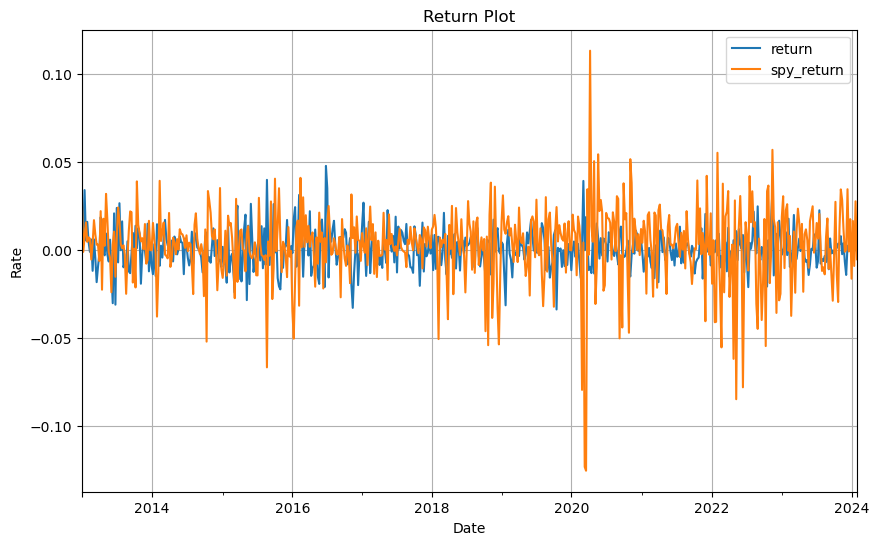

In [394]:
df_t.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

,return,eem_return
return,1.000000,0.106104
eem_return,0.106104,1.000000


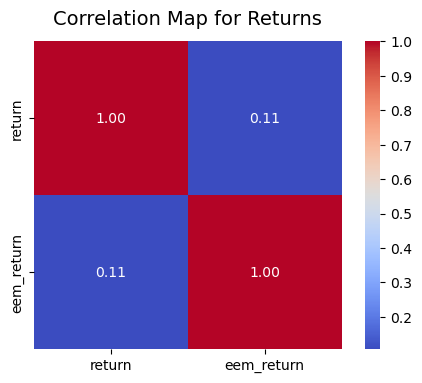

                            OLS Regression Results                            
Dep. Variable:                 return   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     6.570
Date:                Thu, 15 Feb 2024   Prob (F-statistic):             0.0106
Time:                        22:52:26   Log-Likelihood:                 1635.1
No. Observations:                 579   AIC:                            -3266.
Df Residuals:                     577   BIC:                            -3257.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0005      0.001      0.824      0.4

In [395]:
df_y = trade_HUF.loc[:,['return']].copy() 
df_y['eem_return'] = df_eem['return'] 
df_reset = df_y.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(df_y.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(df_y.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(df_y.loc[:,['eem_return']])
Y = df_y['return']
model = sm.OLS(Y, X).fit()
print(model.summary())

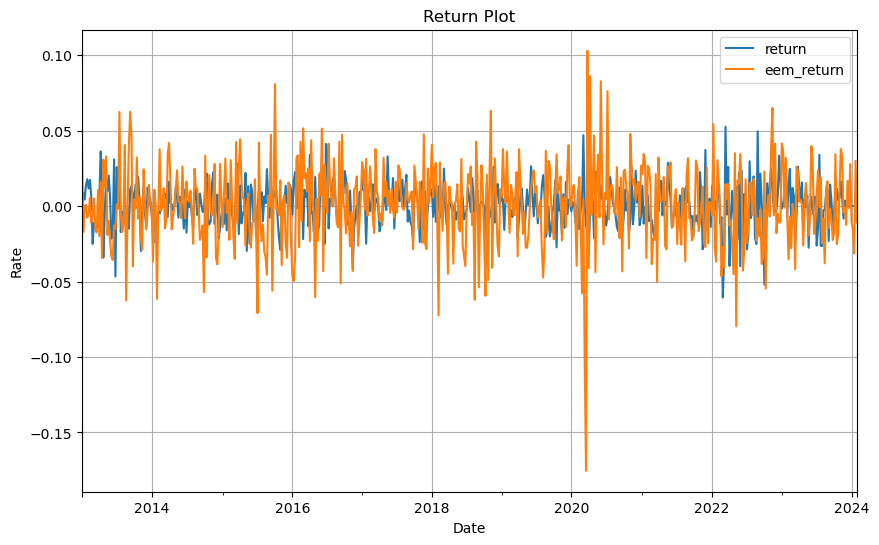

In [396]:
df_y.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

### 4.5 Equally-weighted 

The strategy has a positive mean return of 0.000672, indicating overall profitability. At 0.011609, the volatility is moderate, suggesting some fluctuations in returns but not excessively so. The Sharpe ratio of 0.057865, while positive, is low, indicating that the excess return over the risk-free rate is minimal.

A maximum drawdown of -0.19107 shows the strategy experienced a substantial drop, but not one that would be considered extreme. Both the VaR and CVaR indicate a low probability of extreme losses. A very negative skewness of -2.806117 indicates a distribution with a longer left tail, suggesting the presence of some extreme negative returns. A very high kurtosis of 31.644212 shows a distribution with fat tails, indicating a higher likelihood of extreme returns than a normal distribution would predict.

From all the graph, we can tell the impact of EGP we discussed before. Maybe excluding the EGP will get a better result. 

In [397]:
trade_Equal_wweighted = run_trade_ew(wed_EGP,wed_HUF,wed_CRC,wed_RON)

In [398]:
run_trade_ew(wed_EGP,wed_HUF,wed_CRC,wed_RON,trade_process=False,trade_performance=True,trade_plot=True)

,mean,volatility,sharpe ratio (benchmark = 0),min,max,max drawdown,VaR,CVaR (0.05),Skew,Kurtosis,final return,final pnl,trade length(wk),trade weeks,profit from borrow(rate),profit from lend(rate)
performance summary,0.000672,0.011609,0.057865,-0.133143,0.054658,-0.19107,-0.013802,-0.027472,-2.806117,31.644212,0.000673,3.889429e+06,579,578,0.510381,0.576125


##### Plot (just in case plotly dont work)

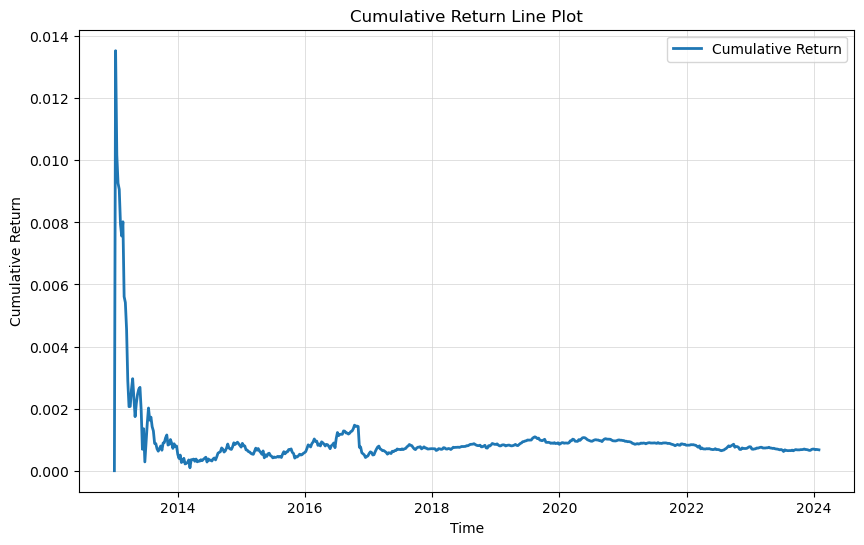

<Figure size 640x480 with 0 Axes>

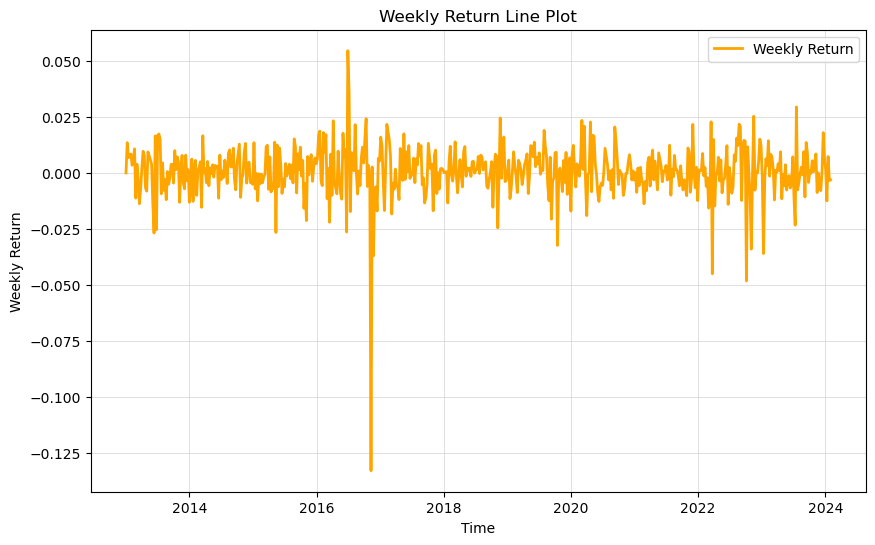

<Figure size 640x480 with 0 Axes>

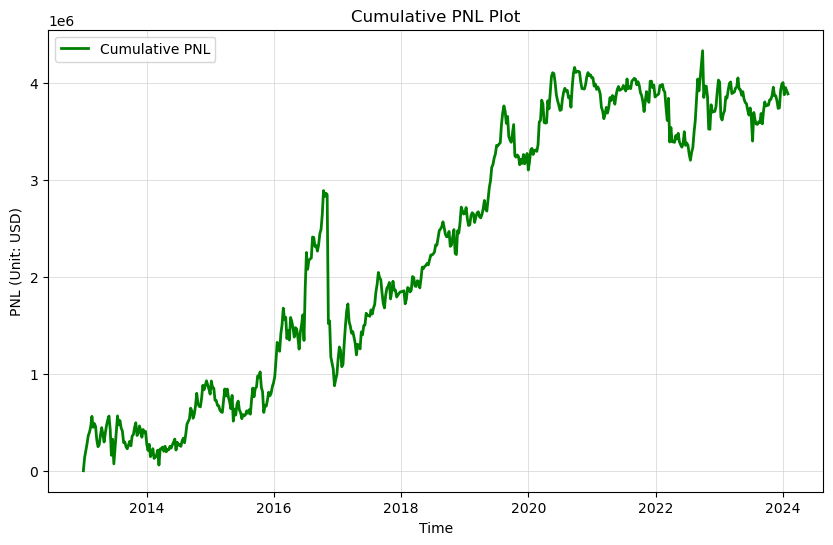

<Figure size 640x480 with 0 Axes>

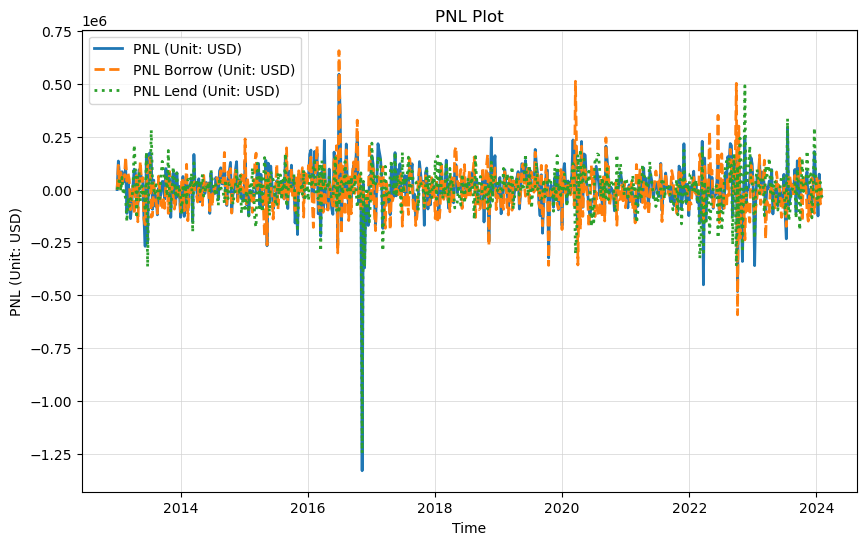

In [399]:
plot(trade_Equal_wweighted)

#### 4.5.2 General discussion about data 

From the performance metrics shown before, we can tell that the effect of EGP market really influence a lot, making the performance worse. 

#### 4.5.3 FF-factors study 

Similar situation appears. 

**Developed-3-ff-factors**

,Mkt-RF,SMB,HML,ret
Mkt-RF,1.000000,-0.324105,-0.051086,0.044231
SMB,-0.324105,1.000000,0.083166,0.012470
HML,-0.051086,0.083166,1.000000,-0.082360
ret,0.044231,0.012470,-0.082360,1.000000


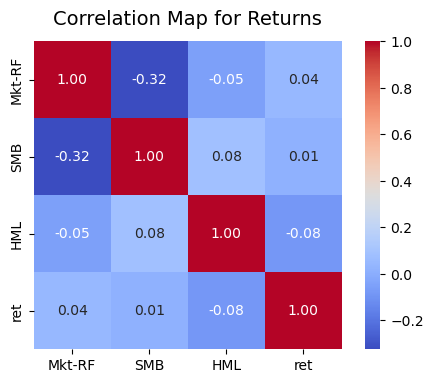

                            OLS Regression Results                            
Dep. Variable:                    ret   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     1.819
Date:                Thu, 15 Feb 2024   Prob (F-statistic):              0.143
Time:                        22:52:27   Log-Likelihood:                 1732.3
No. Observations:                 570   AIC:                            -3457.
Df Residuals:                     566   BIC:                            -3439.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0006      0.000      1.242      0.2

In [400]:
temp1 = ff_factors_dev.loc[:,['Mkt-RF','SMB','HML']]
temp = temp1.copy() 
temp1['ret'] = trade_Equal_wweighted['return']
#temp1
df_reset = temp1.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(temp1.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp1.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(temp1.loc[:,['Mkt-RF','SMB','HML']])
Y = temp1['ret']
model = sm.OLS(Y, X).fit()
print(model.summary())

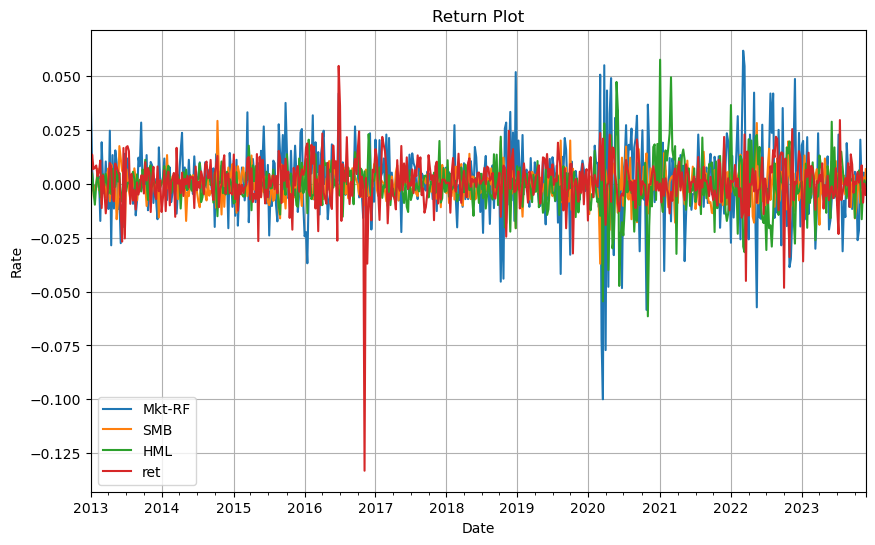

In [401]:
temp1.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

**Emerging-3-ff-factors**

,Mkt-RF,SMB,HML,ret
Mkt-RF,1.000000,-0.233947,0.137397,-0.159984
SMB,-0.233947,1.000000,0.083663,-0.115429
HML,0.137397,0.083663,1.000000,0.098543
ret,-0.159984,-0.115429,0.098543,1.000000


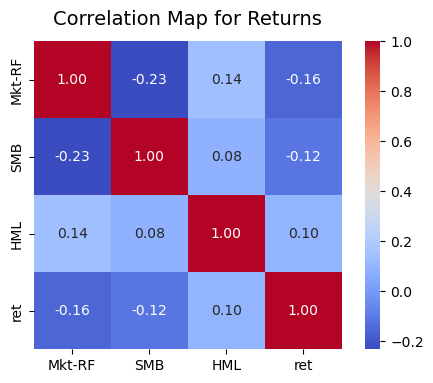

                            OLS Regression Results                            
Dep. Variable:                    ret   R-squared:                       0.070
Model:                            OLS   Adj. R-squared:                  0.049
Method:                 Least Squares   F-statistic:                     3.230
Date:                Thu, 15 Feb 2024   Prob (F-statistic):             0.0247
Time:                        22:52:28   Log-Likelihood:                 243.64
No. Observations:                 132   AIC:                            -479.3
Df Residuals:                     128   BIC:                            -467.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0053      0.003      1.530      0.1

In [402]:
temp1 = ff_factors_emerge.loc[:,['Mkt-RF','SMB','HML']]

temp2 = trade_Equal_wweighted['return'].copy() 
reindexed_returns = temp2.reindex(ff_factors_emerge.index, method='nearest')
temp1['ret'] = reindexed_returns * 4


df_reset = temp1.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(temp1.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(temp1.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(temp1.loc[:,['Mkt-RF','SMB','HML']])
Y = temp1['ret']
model = sm.OLS(Y, X).fit()
print(model.summary())

temp1.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

#### 4.5.4 global index 

,return,spy_return
return,1.000000,-0.173746
spy_return,-0.173746,1.000000


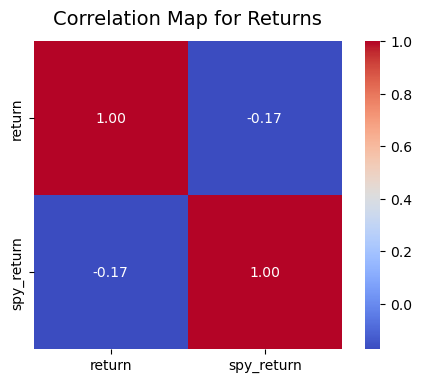

                            OLS Regression Results                            
Dep. Variable:                 return   R-squared:                       0.030
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     17.96
Date:                Thu, 15 Feb 2024   Prob (F-statistic):           2.63e-05
Time:                        22:52:28   Log-Likelihood:                 1767.8
No. Observations:                 579   AIC:                            -3532.
Df Residuals:                     577   BIC:                            -3523.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0009      0.000      1.935      0.0

In [403]:

df_t = trade_Equal_wweighted.loc[:,['return']].copy() 
df_t['spy_return'] = df_spy['return'] 
df_reset = df_t.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(df_t.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(df_t.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(df_t.loc[:,['spy_return']])
Y = df_t['return']
model = sm.OLS(Y, X).fit()
print(model.summary())

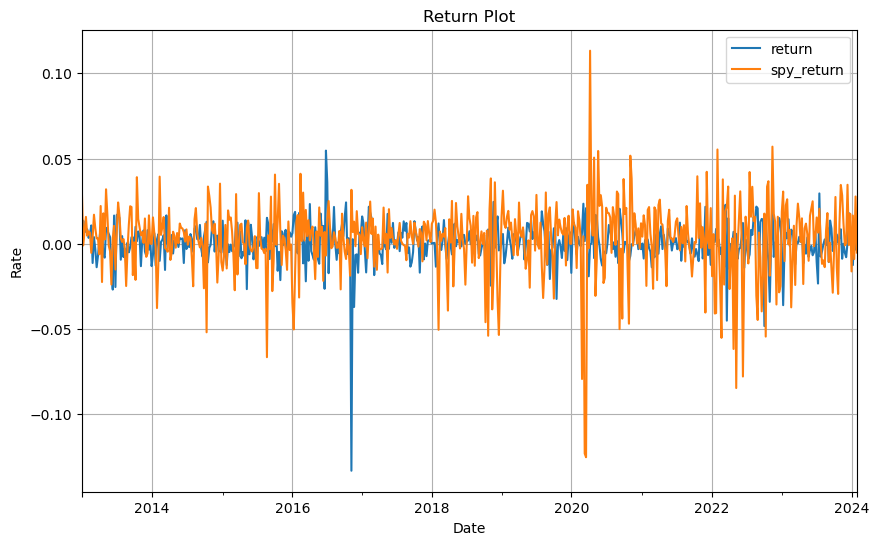

In [404]:
df_t.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

,return,eem_return
return,1.000000,-0.091051
eem_return,-0.091051,1.000000


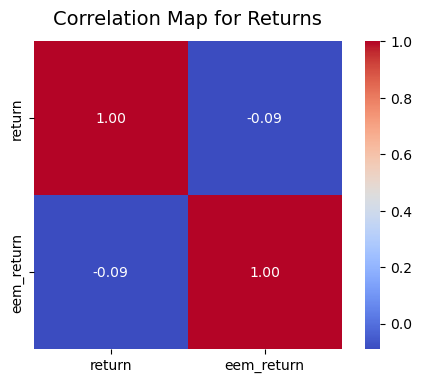

                            OLS Regression Results                            
Dep. Variable:                 return   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     4.823
Date:                Thu, 15 Feb 2024   Prob (F-statistic):             0.0285
Time:                        22:52:28   Log-Likelihood:                 1761.4
No. Observations:                 579   AIC:                            -3519.
Df Residuals:                     577   BIC:                            -3510.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0007      0.000      1.442      0.1

In [405]:
df_y = trade_Equal_wweighted.loc[:,['return']].copy() 
df_y['eem_return'] = df_eem['return'] 
df_reset = df_y.reset_index()
df_melted = df_reset.melt(id_vars=df_reset.columns[0], var_name='Variable', value_name='Return')
fig = px.line(df_melted, x=df_reset.columns[0], y='Return', color='Variable', title='Line Chart for Multiple Returns')
fig.update_layout(
        template="none",
        autosize = True,
        showlegend=True 
    )
iplot(fig)
display(df_y.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(df_y.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()
X = sm.add_constant(df_y.loc[:,['eem_return']])
Y = df_y['return']
model = sm.OLS(Y, X).fit()
print(model.summary())

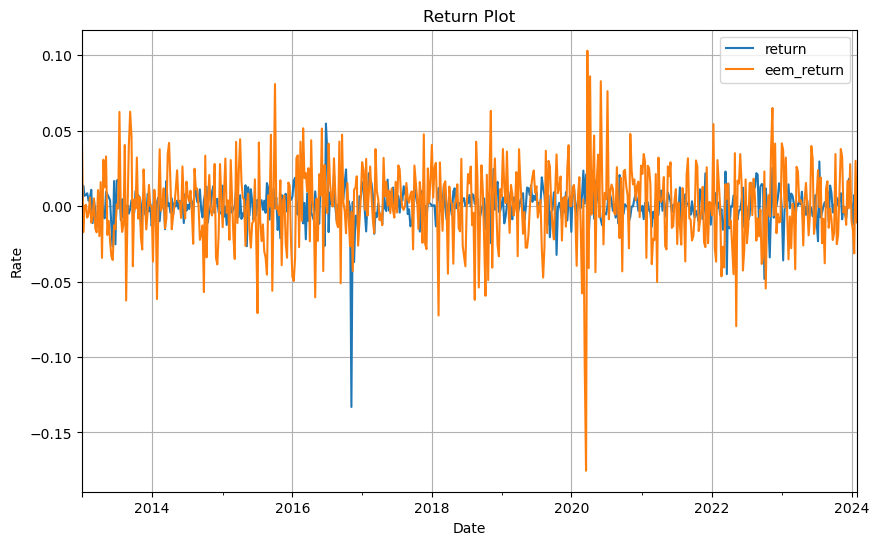

In [406]:
df_y.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

## 5.Trading Performance Analysis 

In previous section, we split the discussion into several parts: 
1. discussing the performance metrics and the pnl related plots 
2. discussing the risk factors: FX rate, bond price (currency, i.r)
3. discussing the ff-fatcors 
4. try to find global index as the benchmark 

In this section, we will continue our study of previous 5 strategies by comparing their performance metrics, their returns, pnl in general. I will aslo do some correlation study to see the effect. 

In [407]:
ret = pd.DataFrame()
pnl = pd.DataFrame() 
ret_cum = pd.DataFrame() 
pnl_cum = pd.DataFrame()

bond_price_diff = pd.DataFrame()

fx_rate = df_rate.loc['2013-01-01':]

### 5.1 Return

The huge loss in EGP market is so outstanding in the graph. If we consider re-do the trading strategy, EGP may be not a good market. 

In [408]:
ret['EGP'] = trade_EGP['return']
ret['HUF']= trade_HUF['return']
ret['CRC']= trade_CRC['return']
ret['RON']= trade_RON['return']
ret['EW']= trade_Equal_wweighted['return']

In [409]:
fig = go.Figure()
for c in ret.columns:
    fig.add_trace(go.Scatter(
            x=ret.index,
            y=ret[c],
            mode='lines',  
            name=c,
    ))
fig.update_layout(
    template="none",
    autosize = True,
    title_text='weekly return',
    showlegend=True 
)
iplot(fig)

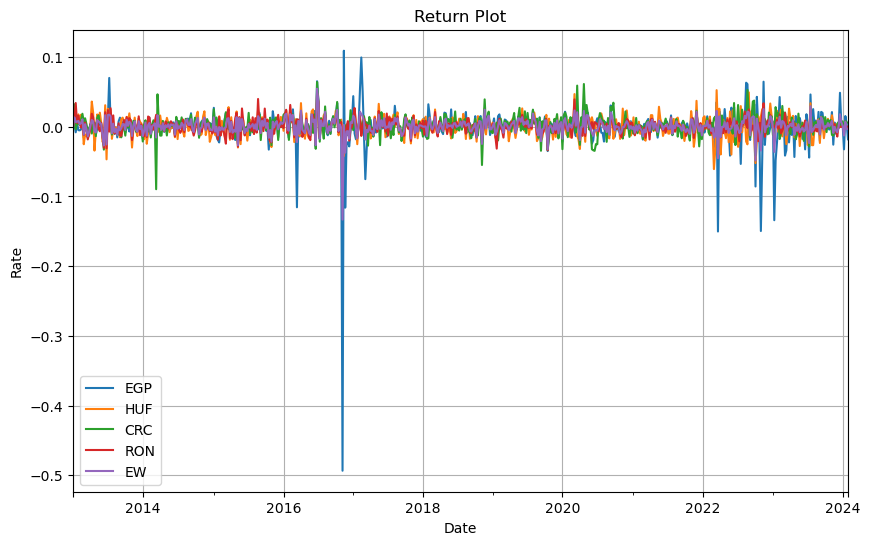

In [410]:
ret.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

### 5.2 PNL 

The EGP strategy become less volatile if other markets are added in, but it still not outperform the single currency strategy. 

In [411]:
pnl['EGP'] = trade_EGP['pnl']
pnl['HUF']= trade_HUF['pnl']
pnl['CRC']= trade_CRC['pnl']
pnl['RON']= trade_RON['pnl']
pnl['EW']= trade_Equal_wweighted['pnl']

In [412]:
fig = go.Figure()
for c in pnl.columns:
    fig.add_trace(go.Scatter(
            x=pnl.index,
            y=pnl[c],
            mode='lines',  
            name=c,
    ))
fig.update_layout(
    template="none",
    autosize = True,
    title_text='weekly pnl',
    showlegend=True 
)
iplot(fig)

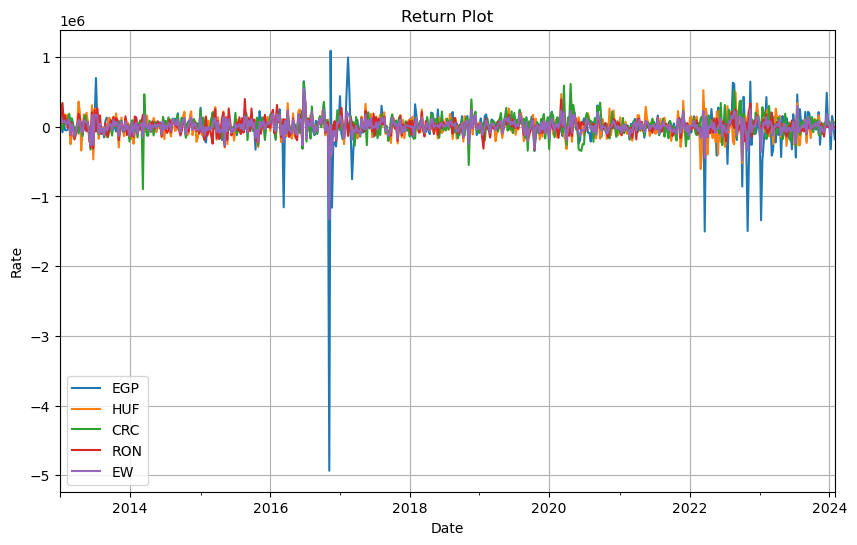

In [413]:
pnl.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

### 5.3 PNL cumulative 

We can clearly see the CRC is the best performed one, other three are quite close and EGP are the worst. It future proves that the volatile market is not suitable for FX Carry Trade. 

In [414]:
pnl_cum['EGP'] = trade_EGP['cumulative_pnl']
pnl_cum['HUF']= trade_HUF['cumulative_pnl']
pnl_cum['CRC']= trade_CRC['cumulative_pnl']
pnl_cum['RON']= trade_RON['cumulative_pnl']
pnl_cum['EW']= trade_Equal_wweighted['cumulative_pnl']

In [415]:
fig = go.Figure()
for c in pnl_cum.columns:
    fig.add_trace(go.Scatter(
            x=pnl_cum.index,
            y=pnl_cum[c],
            mode='lines',  
            name=c,
    ))
fig.update_layout(
    template="none",
    autosize = True,
    title_text='cumulative pnl',
    showlegend=True 
)
iplot(fig)

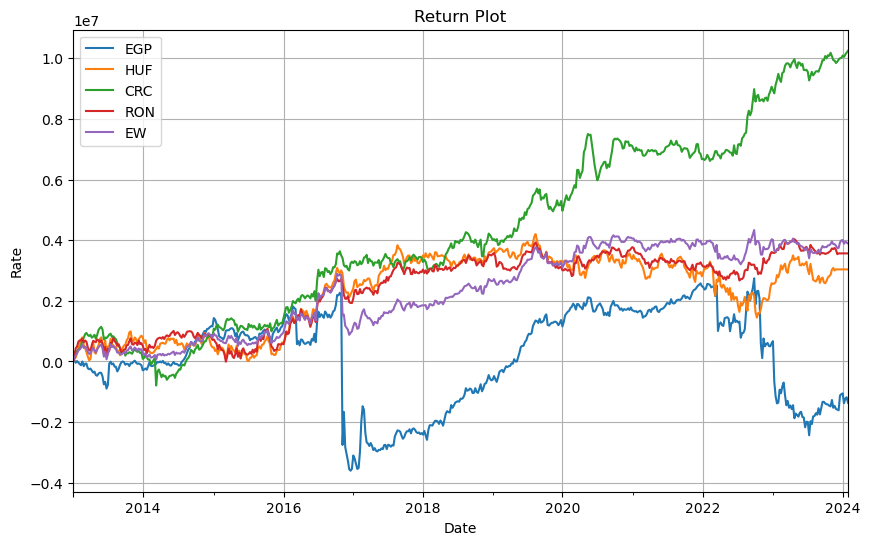

In [416]:
pnl_cum.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

### 5.3 Return cumulative 

There is high degree of correlation among returns for different strategies. For instance, RON and HUF. It suggests that those two might be bad when using together, since the diversification does not increase. 

In [417]:
ret_cum['EGP']= trade_EGP['cumulative_return']
ret_cum['HUF']= trade_HUF['cumulative_return']
ret_cum['CRC']=trade_CRC['cumulative_return']
ret_cum['RON']= trade_RON['cumulative_return']
ret_cum['EW']=trade_Equal_wweighted['cumulative_return']

In [418]:
fig = go.Figure()
for c in ret_cum.columns:
    fig.add_trace(go.Scatter(
            x=ret_cum.index,
            y=ret_cum[c],
            mode='lines',  
            name=c,
    ))
fig.update_layout(
    template="none",
    autosize = True,
    title_text='cumulative return',
    showlegend=True 
)
iplot(fig)

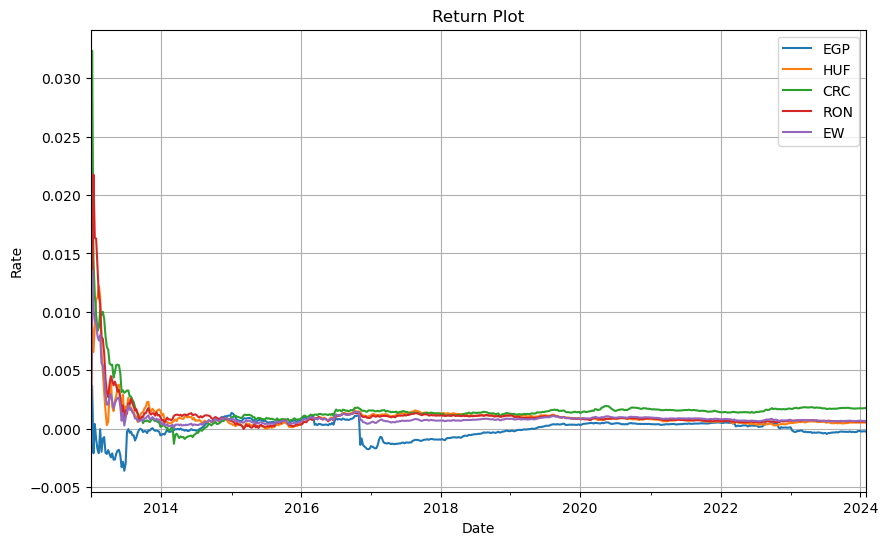

In [419]:
ret_cum.plot(figsize=(10, 6), title='Return Plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

,EGP,HUF,CRC,RON,EW
EGP,1.000000,-0.311964,-0.143715,-0.283974,-0.078829
HUF,-0.311964,1.000000,0.708132,0.890282,0.885905
CRC,-0.143715,0.708132,1.000000,0.740162,0.910055
RON,-0.283974,0.890282,0.740162,1.000000,0.918773
EW,-0.078829,0.885905,0.910055,0.918773,1.000000


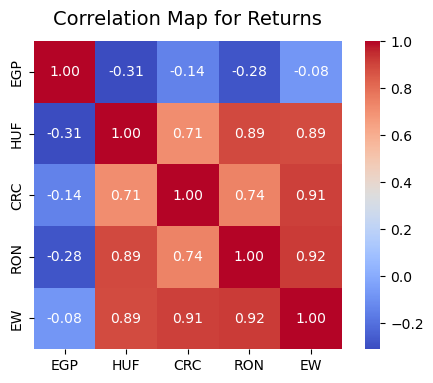

In [420]:
display(ret_cum.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(ret_cum.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for Returns', fontdict={'fontsize': 14}, pad=12)
plt.show()

### 5.5 Bond Price Difference 

CRC has a huge bond difference comparing to others, which might be the reason for it to become the most profitable one. 

In [421]:
bond_price_diff['price_diff_EGP'] = wed_CRC['price_1wk']- wed_CRC['price_now']
bond_price_diff['price_diff_HUF'] = wed_HUF['price_1wk']- wed_HUF['price_now']
bond_price_diff['price_diff_CRC'] = wed_CRC['price_1wk']- wed_CRC['price_now']
bond_price_diff['price_diff_RON'] = wed_RON['price_1wk']- wed_RON['price_now']

In [422]:
fig = go.Figure()
for c in bond_price_diff.columns:
    fig.add_trace(go.Scatter(
            x=bond_price_diff.index,
            y=bond_price_diff[c],
            mode='lines',  
            name=c,
    ))
fig.update_layout(
    template="none",
    autosize = True,
    title_text='bond price diff',
    showlegend=True 
)
iplot(fig)

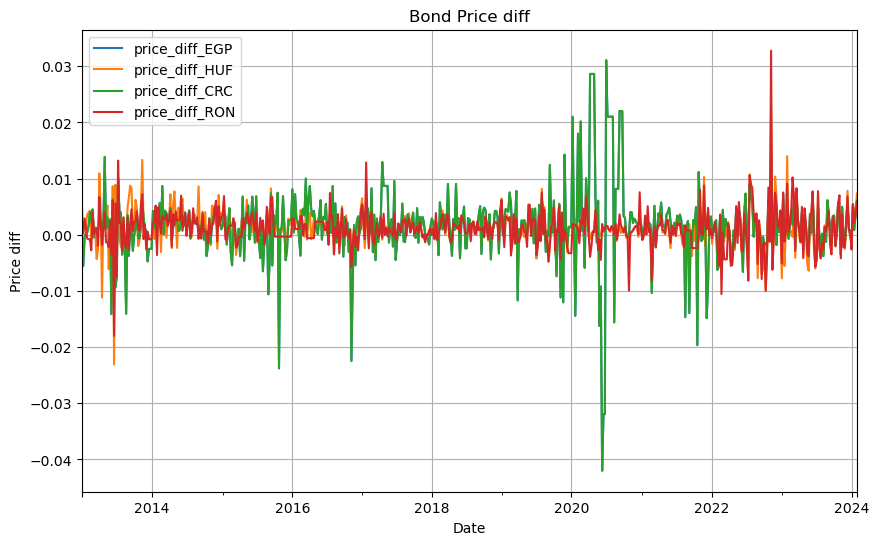

In [423]:
bond_price_diff.plot(figsize=(10, 6), title='Bond Price diff', xlabel='Date', ylabel='Price diff', grid=True)
plt.legend(loc='best')
plt.show()

,price_diff_EGP,price_diff_HUF,price_diff_CRC,price_diff_RON
price_diff_EGP,1.000000,0.307971,1.000000,0.29482
price_diff_HUF,0.307971,1.000000,0.307971,0.80823
price_diff_CRC,1.000000,0.307971,1.000000,0.29482
price_diff_RON,0.294820,0.808230,0.294820,1.00000


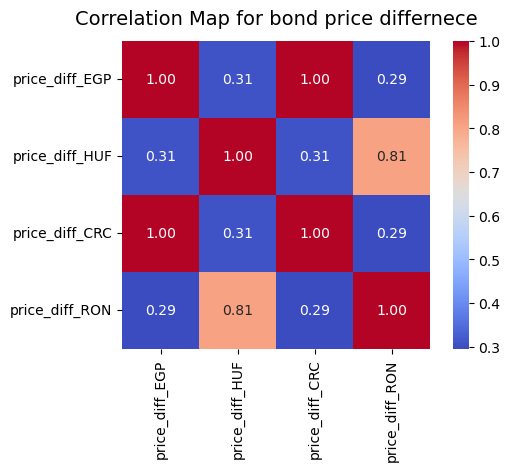

In [424]:
display(bond_price_diff.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(bond_price_diff.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for bond price differnece', fontdict={'fontsize': 14}, pad=12)
plt.show()

### 5.6 FX Rate 

There is also a significant increase in FX rate for CRC but it does not cancel the effect of bond price difference. Generally speaking the FX rate are more volatile than I expected. 

In [425]:
fig = go.Figure()
for c in fx_rate.columns:
    fig.add_trace(go.Scatter(
            x=fx_rate.index,
            y=fx_rate[c],
            mode='lines',  
            name=c,
    ))
fig.update_layout(
    template="none",
    autosize = True,
    title_text='fx rate',
    showlegend=True 
)
iplot(fig)

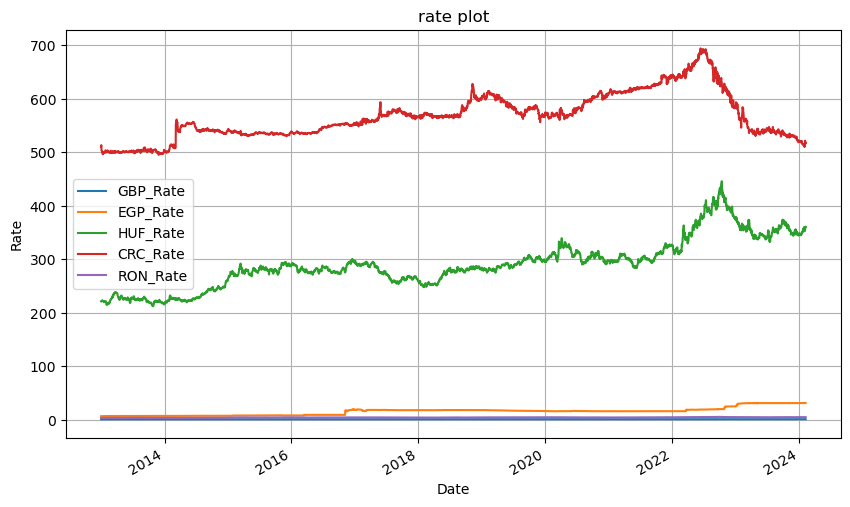

In [426]:
fx_rate.plot(figsize=(10, 6), title='rate plot', xlabel='Date', ylabel='Rate', grid=True)
plt.legend(loc='best')
plt.show()

,GBP_Rate,EGP_Rate,HUF_Rate,CRC_Rate,RON_Rate
GBP_Rate,1.000000,0.773113,0.791388,0.533221,0.865250
EGP_Rate,0.773113,1.000000,0.732810,0.327631,0.740684
HUF_Rate,0.791388,0.732810,1.000000,0.570245,0.954103
CRC_Rate,0.533221,0.327631,0.570245,1.000000,0.578443
RON_Rate,0.865250,0.740684,0.954103,0.578443,1.000000


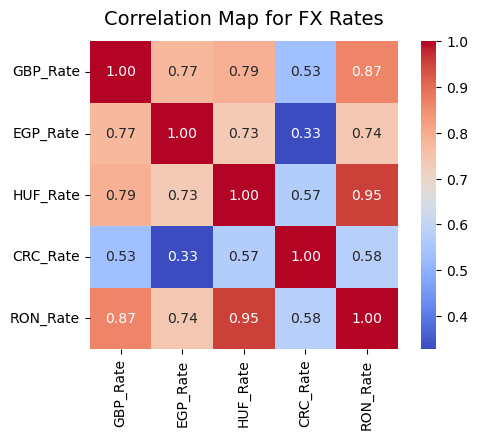

In [427]:
display(fx_rate.corr())
plt.figure(figsize=(6, 4))
ax = sns.heatmap(fx_rate.corr(), annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True) 
ax.set_title('Correlation Map for FX Rates', fontdict={'fontsize': 14}, pad=12)
plt.show()

In [428]:
fx_rate.describe()

,GBP_Rate,EGP_Rate,HUF_Rate,CRC_Rate,RON_Rate
count,4049.000000,4049.000000,4049.000000,4048.000000,4049.000000
mean,0.734619,15.178660,290.452209,566.711969,4.063227
std,0.071852,6.927480,44.866819,42.240689,0.423185
min,0.582661,6.343557,211.806528,494.696998,3.184623
25%,0.665178,7.829356,266.766000,536.118837,3.903557
50%,0.754543,15.755668,285.485899,565.187334,4.097800
75%,0.788024,17.895000,308.837553,595.651237,4.311600
max,0.949311,31.194364,445.435000,693.655915,5.187900


## 6.Conclusion 

1. need more local market index/ perspective to better analyze the trading strategy 
2. need to find more global index rather than just few perspectives. I found some MSCI specefic to the market we are investigating, but don't have enough time for it. 
3. more study about risk factors, more readings regarding the market 
4. if I have time, maybe improve the trading strategy: include transaction cost, allow different weights for different markes, allow to join another markets at any time you want, and etc. 

## 7.Reference 

Data: 
1. https://en.wikipedia.org/wiki/ISO_4217 currency code 
2. https://data.nasdaq.com/databases/CUR CUR documentation 
3. https://www.bankofengland.co.uk/boeapps/database/fromshowcolumns.asp?Travel=NIxAZxSUx&FromSeries=1&ToSeries=50&DAT=RNG&FD=1&FM=Jan&FY=2010&TD=11&TM=May&TY=2025&FNY=Y&CSVF=TT&html.x=66&html.y=26&SeriesCodes=IUDSOIA&UsingCodes=Y&Filter=N&title=IUDSOIA&VPD=Y OIS 
4. famma french factors documentation https://mba.tuck.dartmouth.edu/pages/faculty/ken.french/Data_Library/f-f_5emerging.html, https://mba.tuck.dartmouth.edu/pages/faculty/ken.french/Data_Library/f-f_3developed.html
5. https://data.nasdaq.com/databases/EOD


